# COMP30850 Network Analysis - Assignment 2 - Student ID: 19206730

**The objective of this assignment is to model different network representations using pre-collected Twitter data on Formula1. Foundings were analysed according to the sport's updates until the end of 2022. This report is divided into 6 sections:**

**1. Follower network**

**2. Reply network**

**3. Mention network**

**4. User-hashtag network**

**5. Hashtag co-occurrence network**

**6. Dynamic follower network**

In [1]:
import json
import pandas as pd
import networkx as nx
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import itertools
from collections import Counter
from datetime import datetime

## <u>Task 1 - Follower Network:</u>

**Follower data is extracted and loaded into a dataframe below. Here hardcoding pathways is avoided.**

In [2]:
with open("followers.csv") as file:
    data = pd.read_csv(file, sep="\t", parse_dates=["date"])
data

,source,target,date
0,williamsracing,f1,2020-02-14
1,redbullracing,mercedesamgf1,2020-02-19
2,alpinef1team,jensonbutton,2020-04-19
3,mercedesamgf1,schumachermick,2022-08-31
4,astonmartinf1,charles_leclerc,2021-07-29
...,...,...,...
433,f1,carlossainz55,2020-11-29
434,danielricciardo,alpinef1team,2021-05-05
435,schecoperez,astonmartinf1,2021-04-06
436,c4f1,max33verstappen,2021-07-09


**Below, directed and undirected networks are created using information from the dataframe above where each node in the networks represents a user and edges encode follower relations.**

### <u>Directed Network:</u>

In [3]:
directed_followers = nx.DiGraph()
for i, row in data.iterrows():
    directed_followers.add_edge(row[0], row[1])

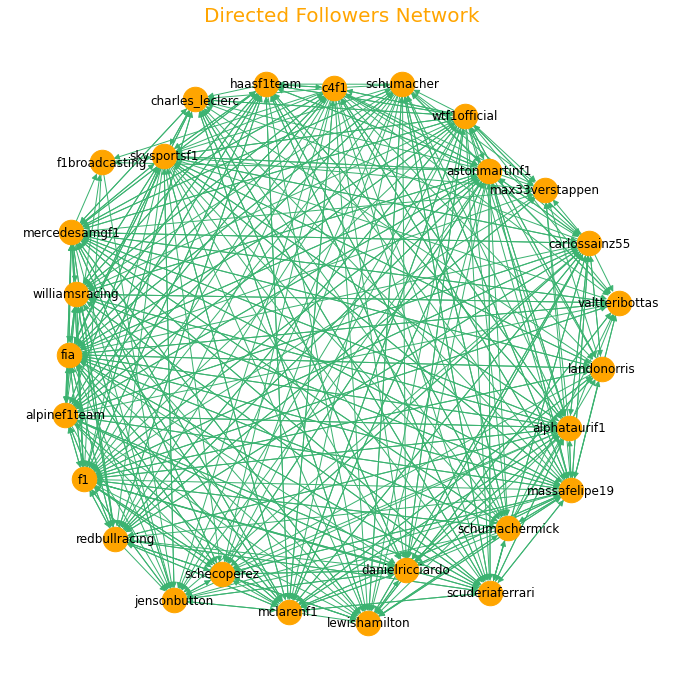

In [4]:
plt.figure(figsize=(12,12))
positioning = nx.spring_layout(directed_followers, k=5)
nx.draw_networkx(directed_followers, positioning, arrowsize=12, node_size=600, node_color="orange", edge_color="mediumseagreen", font_size=12)
plt.title(label="Directed Followers Network", fontsize=20, color="orange")
plt.axis("off");

### <u>Undirected Network:</u>

In [5]:
undirected_followers = directed_followers.to_undirected(reciprocal=True)

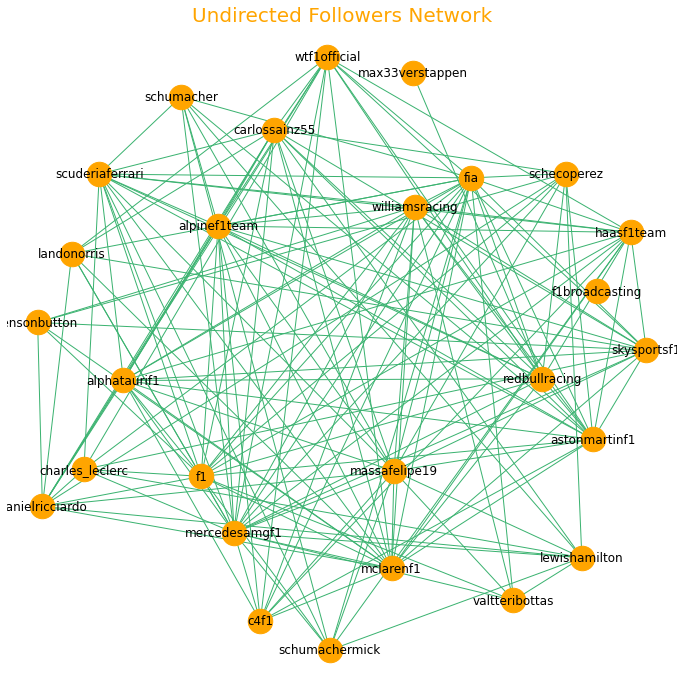

In [6]:
plt.figure(figsize=(12,12))
position = nx.spring_layout(undirected_followers, k=3)
nx.draw_networkx(undirected_followers, position, node_size=600, node_color="orange", edge_color="mediumseagreen", font_size=12)
plt.title(label="Undirected Followers Network", fontsize=20, color="orange")
plt.axis("off");

### <u>Network Characteristics:</u>

#### <u>In-Degree and Out-Degree Distribution:</u>

**In the case of a directed network, two separate measures of degree centrality are defined as in-degree and out-degree. In-degree is the count of the number of ties directed to the node and out-degree is the number of ties that the node directs to others. When connections between nodes are associated to some aspects such as friendship or collaboration, in-degree is often interpreted as a form of popularity, and outdegree as gregariousness.**

In [7]:
in_degree = pd.Series(dict(directed_followers.in_degree()), name="In-degree")
in_degree = pd.DataFrame(in_degree).sort_values(by="In-degree", ascending=False)
in_degree.head(15)

,In-degree
f1,24
mercedesamgf1,21
lewishamilton,21
fia,20
redbullracing,19
mclarenf1,19
jensonbutton,19
schecoperez,18
alphataurif1,18
massafelipe19,18


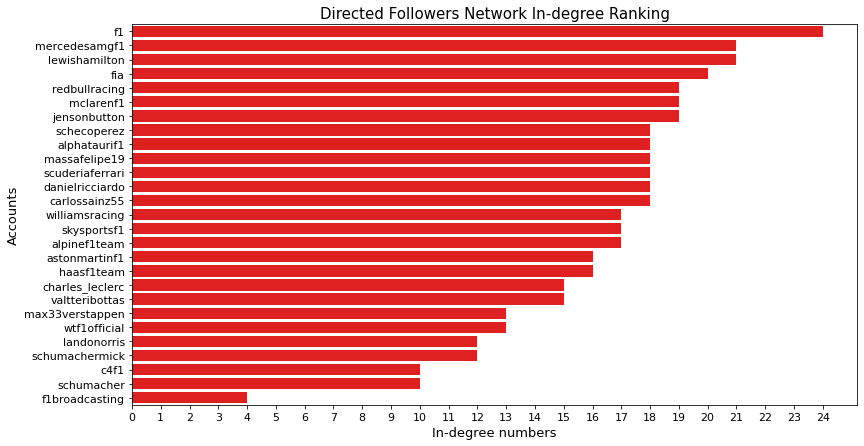

In [8]:
plt.figure(figsize=(13,7))
sns.barplot(data=in_degree, x="In-degree", y=in_degree.index, color="red")
plt.title("Directed Followers Network In-degree Ranking", fontsize=15)
plt.xlabel("In-degree numbers", fontsize=13)
plt.ylabel("Accounts", fontsize=13)
plt.xticks(range(max(in_degree["In-degree"])+1))
plt.tick_params(labelsize=11);

**From the above graph, it can be observed that the accounts with the most followers are the accounts that either regulate Formula1 rules, coordinate events and share updates such as F1 and FIA or the accounts that belong to teams that have dominated the races and won many Constuctor Championships such as Mercedes (8 times), McLaren (8 times) and Redbull (5 times) - as of 2022.**

In [9]:
out_degree = pd.Series(dict(directed_followers.out_degree()), name="Out-degree")
out_degree = pd.DataFrame(out_degree).sort_values(by="Out-degree", ascending=False)
out_degree.head(15)

,Out-degree
c4f1,26
wtf1official,25
astonmartinf1,25
fia,25
massafelipe19,24
mercedesamgf1,24
skysportsf1,23
alpinef1team,22
schumacher,21
mclarenf1,20


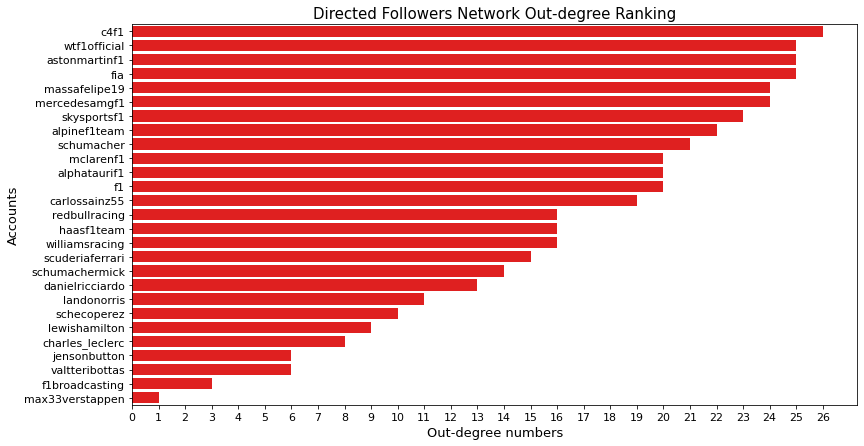

In [10]:
plt.figure(figsize=(13,7))
sns.barplot(data=out_degree, x="Out-degree", y=out_degree.index, color="red")
plt.title("Directed Followers Network Out-degree Ranking", fontsize=15)
plt.xlabel("Out-degree numbers", fontsize=13)
plt.ylabel("Accounts", fontsize=13)
plt.xticks(range(max(out_degree["Out-degree"])+1))
plt.tick_params(labelsize=11);

**From the graph above, we can observe that the highest out-degree counts are obtained for accounts that interacts with fans, teams, athletes and are "sociable" by nature such as news networks or Formula1 officials. To name a few of these accounts: c4f1 (#1 highest out-degree), wtf1official (#2 highest out-degree), fia (#2 highest out-degree), skysportsf1 (#4 highest out-degree).**

#### <u>Basic Characteristics:</u>

**Different network characteristics are explored individually for directed and undirected networks.**

**For undirected networks, some basic characteristics are investigated:**
- **Number of Nodes and Edges**
- **Network Density**
- **Average Clustering Coefficient**
- **Network Diameter and Shortest Path**

**For directed networks, some basic characteristics as well as other characteristics are investigated such as:**
- **Average In and Out Degrees**
- **Number of Strongly/Weakly Components**
- **Reciprocity**

In [11]:
def characteristics(network):
    if nx.is_directed(network) == False:
        print("Number of Nodes: %d, Number of Edges: %d" % (network.number_of_nodes(), network.number_of_edges()))
        print("Density: ", nx.density(network))
        print("Average Clustering Coefficient: ", nx.average_clustering(network))
        
        d = list(nx.connected_components(network))[0]
        diameter = nx.diameter(nx.subgraph(network, d))
        av_shortest = nx.average_shortest_path_length(nx.subgraph(network, d))
        print("Diameter: " + str(diameter) + ", Average Shortest Path: " + str(av_shortest))
    
    else:
        directed_characteristics(network)

In [12]:
def directed_characteristics(network):
    if nx.is_directed(network) == True:
        print("Number of Nodes: %d, Number of Edges: %d" % (network.number_of_nodes(), network.number_of_edges()))
        print("Density: ", nx.density(network))
        print("Average Clustering Coefficient: ", nx.average_clustering(network))
        print()

        print("Average In-Degree: ", pd.Series(dict(network.in_degree())).mean())
        print("Average Out-Degree: ", pd.Series(dict(network.out_degree())).mean())
        print()
        
        print("Number of strongly connected components: ", nx.number_strongly_connected_components(network))
        print("Number of weakly connected components: ", nx.number_weakly_connected_components(network))
        print("Reciprocity: ", nx.reciprocity(network))
        
    else:
        characteristics(network)

In [13]:
characteristics(directed_followers)

Number of Nodes: 27, Number of Edges: 438
Density:  0.6239316239316239
Average Clustering Coefficient:  0.7271324770971703

Average In-Degree:  16.22222222222222
Average Out-Degree:  16.22222222222222

Number of strongly connected components:  1
Number of weakly connected components:  1
Reciprocity:  0.7488584474885844


In [14]:
characteristics(undirected_followers)

Number of Nodes: 27, Number of Edges: 164
Density:  0.4672364672364672
Average Clustering Coefficient:  0.6053503647672893
Diameter: 3, Average Shortest Path: 1.5323076923076924


#### <u>Node Degree Distribution:</u>

**Node degree distributions are calculated seperately for the directed and undirected network. Results of these calculations are compared to each other where we can observe higher degree counts for the directed network.**

In [15]:
def node_degree_distribution(network):
    degree = pd.Series(dict(nx.degree(network)))
    print("Range [minimum, maximum]: [%d,%d]" % (degree.min(), degree.max()))
    print("Mean (Average): ", degree.mean())
    print("Median: ", degree.median())
    return degree

In [16]:
print("Undirected Network Degree Statistics:")
undirected_degree = node_degree_distribution(undirected_followers)

Undirected Network Degree Statistics:
Range [minimum, maximum]: [0,21]
Mean (Average):  12.148148148148149
Median:  14.0


In [17]:
print("Directed Network Degree Statistics:")
directed_degree = node_degree_distribution(directed_followers)

Directed Network Degree Statistics:
Range [minimum, maximum]: [7,45]
Mean (Average):  32.44444444444444
Median:  33.0


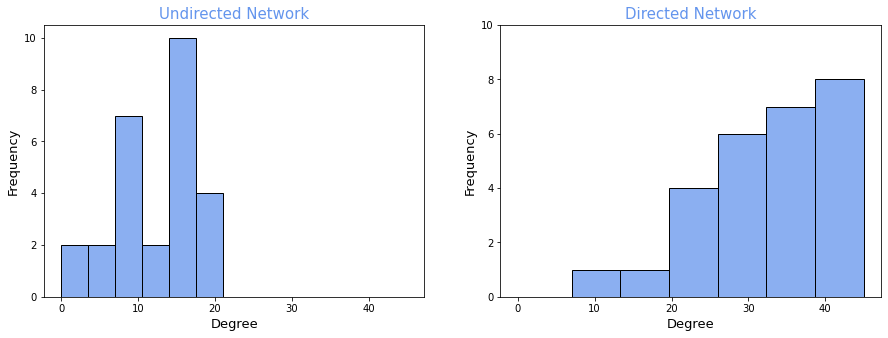

In [18]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,5), sharex=True)

sns.histplot(data=undirected_degree, color="cornflowerblue", ax=ax1)
ax1.set_xlabel("Degree", fontsize=13)
ax1.set_ylabel("Frequency", fontsize=13)
ax1.set_title(label="Undirected Network", fontsize=15, color="cornflowerblue")

sns.histplot(data=directed_degree, color="cornflowerblue", ax=ax2)
ax2.set_xlabel("Degree", fontsize=13)
ax2.set_ylabel("Frequency", fontsize=13)
ax2.set_title(label="Directed Network", fontsize=15, color="cornflowerblue")
plt.ylim(0, 10)

plt.show()

#### <u>Centrality:</u>

**Centrality is used to identify the most important nodes in a network model. In this section, listed centrality measures are investigated:**
- **Degree C. --> measured by the degree of each n node divided by n-1** 
- **Betweenness C. -->  used to find "bridging" nodes in a network which are nodes that occur on shortest paths between other nodes**  
- **Closeness C. --> measures the extend to which a node is close to all other nodes in a network (directly or indirectly)** 
- **Eigenvector C. --> eigenvector of a node is proportional to the sum of the centrality scores of its neighbours, meaning that a node is important if it is connected to other important nodes** 

In [19]:
def centrality(network, sorting_column):
    c_degree = nx.degree_centrality(network)
    series = pd.Series(c_degree)
    c_df = pd.DataFrame(series, columns=["Degree"])
    
    betweenness = nx.betweenness_centrality(network, weight="weight")
    c_df["Betweenness"] = pd.Series(betweenness)
    
    closeness = nx.closeness_centrality(network)
    c_df["Closeness"] = pd.Series(closeness)
    
    eigenvector = nx.eigenvector_centrality(network, weight="weight")
    c_df["Eigenvector"] = pd.Series(eigenvector)
    
    return c_df.sort_values(by=sorting_column, ascending=False).head(15)

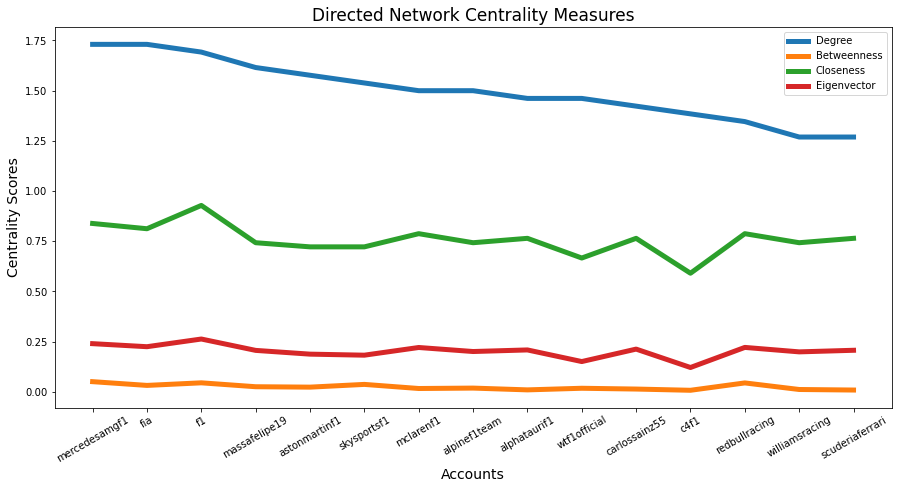

In [20]:
directed_c = centrality(directed_followers, "Degree")
plt.figure(figsize=(15,7))
plt.plot(directed_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Directed Network Centrality Measures", fontsize=17)
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30);

**From the lineplot above, we can observe that closeness and eigenvalue measures follow a similar trend as the degree scores decrease in the directed network. As for the undirected network centrality measures shown below, the three other measures again follow similar trends as the degree values get smaller.**

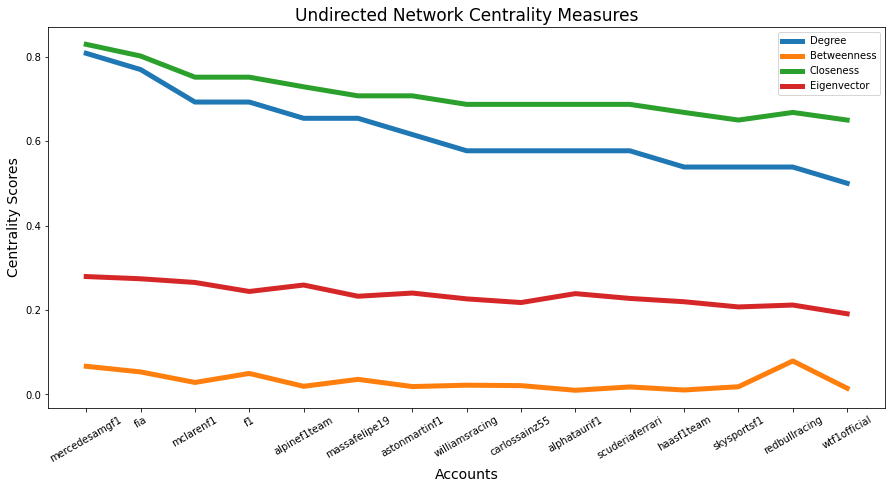

In [21]:
undirected_c = centrality(undirected_followers, "Degree")
plt.figure(figsize=(15,7))
plt.plot(undirected_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Undirected Network Centrality Measures", fontsize=17)
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30);

#### <u>Ego-Centric Analysis:</u>

**Egocentric analysis provides valuable insights into a chosen node's network influences and connections. However, it is important to recognize that this method only provides a partial view of the larger network and may not capture the full complexity and interdependence of network relationships.**

In [22]:
def egocentric(network, ego):
    
    ego_ = nx.ego_graph(network, ego)
    pos = nx.spring_layout(network, k=100) 
    
    plt.figure(figsize=(15,10))
    plt.margins(0.1, 0.1)
    title = "Ego Network for " + ego + " - connected to " + str(ego_.number_of_nodes()) + " nodes"
    plt.title(title, fontsize=15, color="deeppink")
    
    nx.draw_networkx(ego_, pos, with_labels=True, font_size=13, node_size=400, node_color="pink", edge_color="purple")
    nx.draw_networkx_nodes(ego_, pos, nodelist=[ego], node_size=1500, node_color="deeppink")
    
    plt.show()

    edges = []
    for node, edge in network.edges([ego]):
        edges.append(edge)
    print(node, "is connected to: ")
    print(edges)

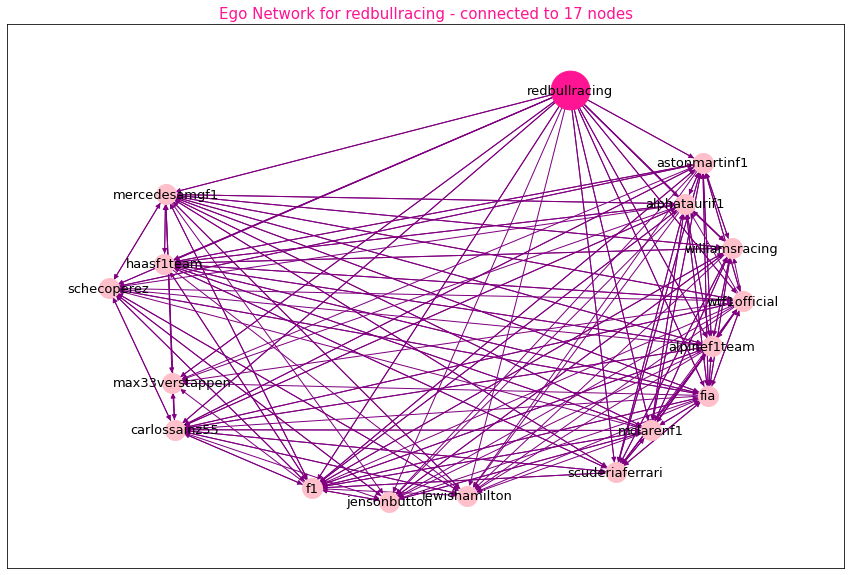

redbullracing is connected to: 
['mercedesamgf1', 'scuderiaferrari', 'alpinef1team', 'fia', 'wtf1official', 'mclarenf1', 'schecoperez', 'haasf1team', 'max33verstappen', 'williamsracing', 'jensonbutton', 'astonmartinf1', 'carlossainz55', 'lewishamilton', 'f1', 'alphataurif1']


In [23]:
egocentric(directed_followers, "redbullracing")

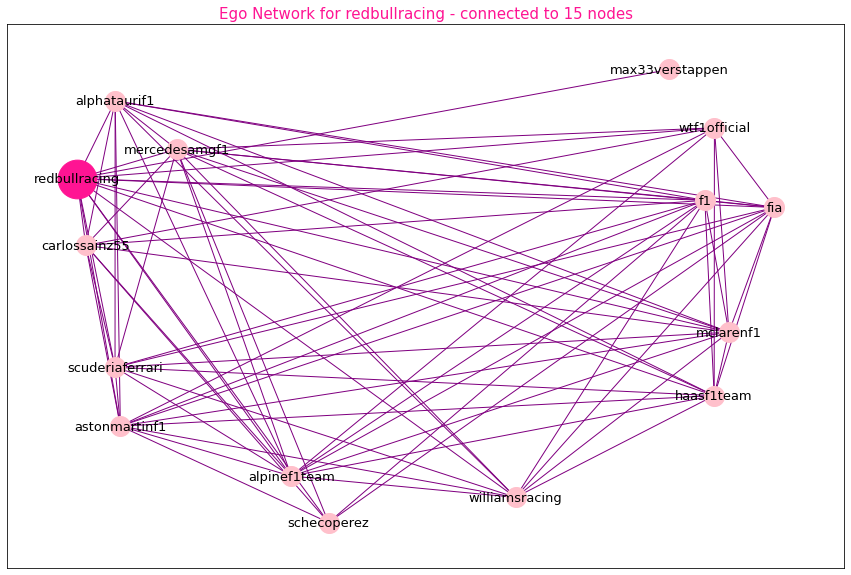

redbullracing is connected to: 
['williamsracing', 'f1', 'mercedesamgf1', 'scuderiaferrari', 'alpinef1team', 'fia', 'wtf1official', 'mclarenf1', 'schecoperez', 'haasf1team', 'max33verstappen', 'astonmartinf1', 'carlossainz55', 'alphataurif1']


In [24]:
egocentric(undirected_followers, "redbullracing")

**To demonstrate the way egocentric analysis works, from the graphs above, we find that the redbullracing team doesn't have reciprocated following relationships with accounts jensonbutton and lewishamilton as they only appear in the ego network associaated with the undirected followers network.**

## <u>Task 2 - Reply Network:</u>

**Tweets and user accounts are loaded into dataframes and preprocessed (unnecessary data is cleaned) to be analysed. Here an initial reply network is constructed to be further processed in this task. In the reply networks below, nodes will either be users from the list or users from the wider Twitter platform - i.e. users who are not necessarily members of the list, but received replies from users on the list. Edges encode these replies between users.**

In [25]:
tweets = []
with open("tweets.jsonl") as file:
    for line in file:
        tweets.append(json.loads(line))
        
accounts = []
with open("list_members.jsonl") as file:
    for line in file:
        accounts.append(json.loads(line))

In [26]:
tweets_df = pd.DataFrame(tweets)
tweets_df.head(5)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status,withheld_scope,withheld_copyright,withheld_in_countries
0,Mon Nov 07 21:58:11 +0000 2022,1589739012226314240,1589739012226314240,"Toto: ""seja no asfalto de Interlagos ou como d...",False,"[0, 278]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1589738418782834693, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.589739e+18,...,False,pt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sat Nov 12 18:11:03 +0000 2022,1591493791940497408,1591493791940497408,RT @AndyRobinson100: In the Senna S's today wi...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",NaN,...,NaN,en,{'created_at': 'Sat Nov 12 14:18:57 +0000 2022...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Fri Oct 21 17:05:14 +0000 2022,1583504696358371329,1583504696358371329,He experimented with Arri lights and light bar...,False,"[0, 256]","{'hashtags': [{'text': 'IAM', 'indices': [234,...","{'media': [{'id': 1583504402203164675, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.583503e+18,...,False,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Wed Nov 09 18:14:13 +0000 2022,1590407425743785984,1590407425743785984,@lewisloverr ❤️❤️,False,"[13, 17]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.590065e+18,...,NaN,und,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Fri Sep 09 11:56:22 +0000 2022,1568206677853278211,1568206677853278211,"No 5 minute intro or music from @F1, just the ...",False,"[0, 113]","{'hashtags': [{'text': 'ItalianGP', 'indices':...",NaN,"<a href=""http://twitter.com/download/android"" ...",1.568204e+18,...,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
tweets_df = tweets_df.drop(["truncated", "display_text_range", "extended_entities", "source", 
              "in_reply_to_status_id", "possibly_sensitive", "lang", "retweeted_status", "quoted_status_id", 
             "quoted_status_id_str", "quoted_status_permalink", "quoted_status", "withheld_scope", 
              "withheld_copyright", "withheld_in_countries", "geo", "coordinates", "place", "contributors", 
            "is_quote_status", "favorited", "retweeted"], axis=1)
tweets_df.head(5)

,created_at,id,id_str,full_text,entities,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,retweet_count,favorite_count
0,Mon Nov 07 21:58:11 +0000 2022,1589739012226314240,1589739012226314240,"Toto: ""seja no asfalto de Interlagos ou como d...","{'hashtags': [], 'symbols': [], 'user_mentions...",1589739002579808256,2.623526e+07,26235265,MercedesAMGF1,"{'id': 26235265, 'id_str': '26235265', 'name':...",543,5161
1,Sat Nov 12 18:11:03 +0000 2022,1591493791940497408,1591493791940497408,RT @AndyRobinson100: In the Senna S's today wi...,"{'hashtags': [], 'symbols': [], 'user_mentions...",None,NaN,None,None,"{'id': 24871896, 'id_str': '24871896', 'name':...",9,0
2,Fri Oct 21 17:05:14 +0000 2022,1583504696358371329,1583504696358371329,He experimented with Arri lights and light bar...,"{'hashtags': [{'text': 'IAM', 'indices': [234,...",1583503387823423490,1.614354e+07,16143542,AstonMartinF1,"{'id': 16143542, 'id_str': '16143542', 'name':...",6,123
3,Wed Nov 09 18:14:13 +0000 2022,1590407425743785984,1590407425743785984,@lewisloverr ❤️❤️,"{'hashtags': [], 'symbols': [], 'user_mentions...",1590064993055440899,1.447935e+18,1447934730826043402,lewisloverr,"{'id': 108247668, 'id_str': '108247668', 'name...",0,9
4,Fri Sep 09 11:56:22 +0000 2022,1568206677853278211,1568206677853278211,"No 5 minute intro or music from @F1, just the ...","{'hashtags': [{'text': 'ItalianGP', 'indices':...",1568204065175207938,5.058090e+08,505809036,f1broadcasting,"{'id': 505809036, 'id_str': '505809036', 'name...",3,27


In [28]:
# preprocessing - data is restructured i.e. cleaning null values and updating account names to start with lowercase
replies_df = tweets_df[pd.notnull(tweets_df["in_reply_to_screen_name"].str.lower())]
reply_network = nx.DiGraph()

for i, row in replies_df.iterrows():
    if row["in_reply_to_screen_name"] != row["user"]["screen_name"]:
        reply_network.add_edge(row["user"]["screen_name"].lower(), row["in_reply_to_screen_name"].lower())  

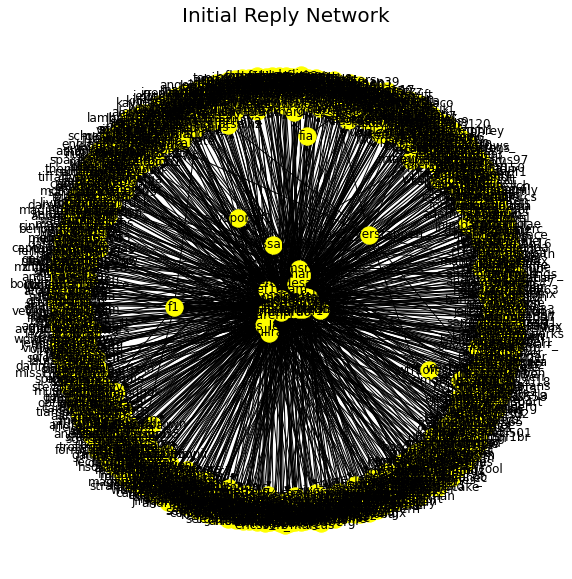

In [29]:
plt.figure(figsize=(10,10))
nx.draw_networkx(reply_network, with_labels=True, node_size=300, node_color="yellow")
plt.title(label="Initial Reply Network", fontsize=20)
plt.axis("off");

In [30]:
characteristics(reply_network)

Number of Nodes: 1034, Number of Edges: 1159
Density:  0.0010850820411900514
Average Clustering Coefficient:  0.01158884931211344

Average In-Degree:  1.120889748549323
Average Out-Degree:  1.120889748549323

Number of strongly connected components:  1015
Number of weakly connected components:  1
Reciprocity:  0.024158757549611734


In [31]:
reply_degres = node_degree_distribution(reply_network)
reply_degres.sort_values(ascending=False).head(10)

Range [minimum, maximum]: [1,218]
Mean (Average):  2.241779497098646
Median:  1.0


scuderiaferrari    218
mercedesamgf1      120
jensonbutton       113
f1broadcasting     101
astonmartinf1      100
landonorris         81
mclarenf1           69
charles_leclerc     61
williamsracing      48
danielricciardo     46
dtype: int64

In [32]:
accounts_df = pd.DataFrame(accounts)
account_names = list(accounts_df["screen_name"])

accounts_network = nx.DiGraph()

for i, row in replies_df.iterrows():
    if row["in_reply_to_screen_name"] in account_names and row["in_reply_to_screen_name"] != row["user"]["screen_name"]:
        accounts_network.add_edge(row["user"]["screen_name"].lower(), row["in_reply_to_screen_name"].lower())  

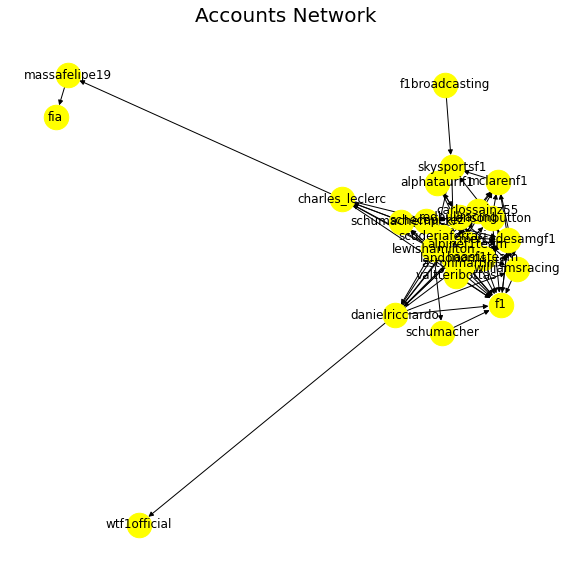

In [33]:
plt.figure(figsize=(10,10))
nx.draw_networkx(accounts_network, with_labels=True, node_size=600, node_color="yellow")
plt.title(label="Accounts Network", fontsize=20)
plt.axis("off");

In [34]:
replies_df_c = centrality(reply_network, "Degree")
replies_corr = replies_df_c.corr()

accounts_df_c = centrality(accounts_network, "Degree")
acccounts_corr = accounts_df_c.corr()

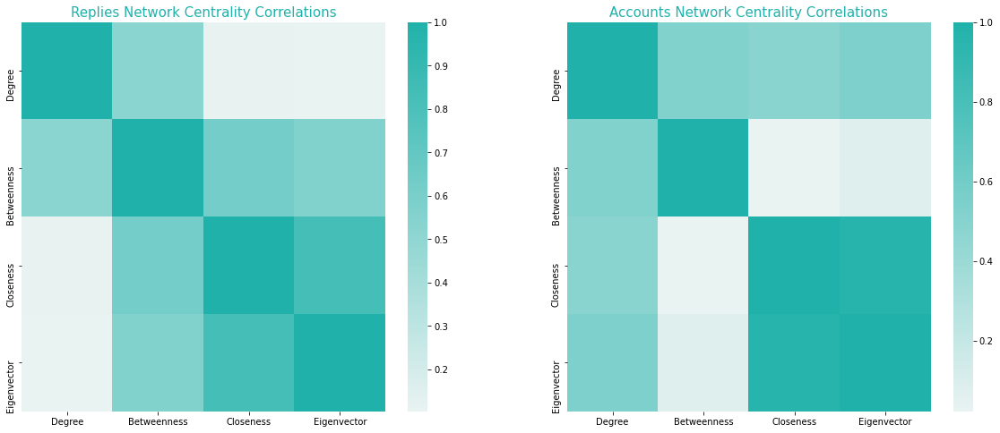

In [35]:
fig, (ax3, ax4) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), sharex=True)
sns.heatmap(data=replies_corr, cmap=sns.light_palette("lightseagreen", as_cmap=True), ax=ax3)
ax3.set_title("Replies Network Centrality Correlations", fontsize=15, color="lightseagreen")
sns.heatmap(data=acccounts_corr, cmap=sns.light_palette("lightseagreen", as_cmap=True), ax=ax4)
ax4.set_title("Accounts Network Centrality Correlations", fontsize=15, color="lightseagreen");

**The below graph depicts centrality measures for the Reply Network as degree gets larger on the x-axis. However, this graph does not provide easy comparison within measures. For this, each centrality measure can be viewed below individually represented with accounts that have the highest scores.**

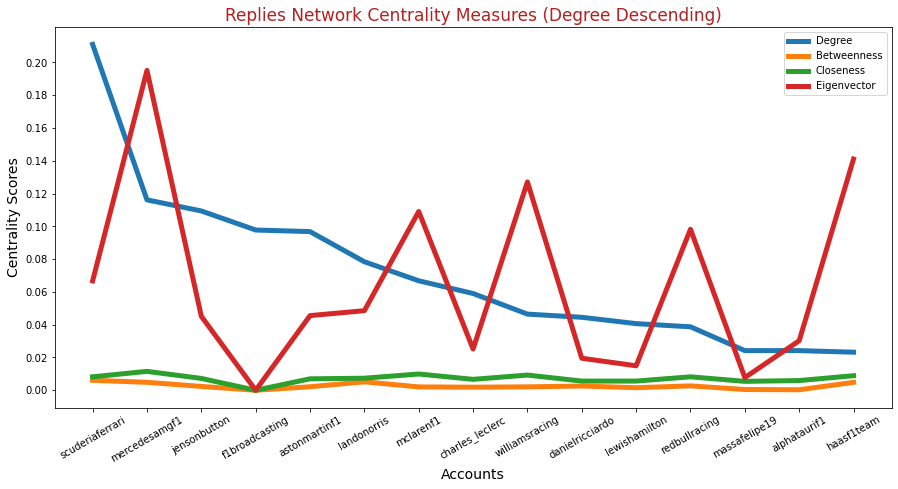

In [36]:
plt.figure(figsize=(15,7))
plt.plot(replies_df_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Replies Network Centrality Measures (Degree Descending)", fontsize=17, color="firebrick")
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30)
plt.yticks([0.00, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2]);

In [37]:
def centrality_dataframes(network, measure):
    c_df = centrality(reply_network, measure)
    new_df = c_df[measure].copy()
    new_df = pd.DataFrame(new_df)
    new_df = new_df.sort_values([measure], ascending=False)
    return new_df.head(8)

In [38]:
def plot_barh(network):
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,10))

    d_df = centrality_dataframes(network, "Degree")
    ax[0,0].barh(d_df.index, d_df["Degree"], color="blue")
    ax[0,0].set_xlabel("Degree", fontsize=13)
    ax[0,0].set_xlim([0.05, 0.225])
    ax[0,0].set_ylabel("Accounts", fontsize=13)
    ax[0,0].set_title("Degree Centrality", color="blue", fontsize=15)

    b_df = centrality_dataframes(network, "Betweenness")
    ax[0,1].barh(b_df.index, b_df["Betweenness"], color="orange")
    ax[0,1].set_xlabel("Betweenness", fontsize=13)
    ax[0,1].set_xlim([0.001, 0.0065])
    ax[0,1].set_ylabel("Accounts", fontsize=13)
    ax[0,1].set_title("Betweenness Centrality", color="orange", fontsize=15)

    c_df = centrality_dataframes(network, "Closeness")
    ax[1,0].barh(c_df.index, c_df["Closeness"], color="green")
    ax[1,0].set_xlabel("Closeness", fontsize=13)
    ax[1,0].set_xlim([0.007, 0.015])
    ax[1,0].set_ylabel("Accounts", fontsize=13)
    ax[1,0].set_title("Closeness Centrality", color="green", fontsize=15)

    e_df = centrality_dataframes(network, "Eigenvector")
    ax[1,1].barh(e_df.index, e_df["Eigenvector"], color="red")
    ax[1,1].set_xlabel("Eigenvector", fontsize=13)
    ax[1,1].set_xlim([0.05, 0.25])
    ax[1,1].set_ylabel("Accounts", fontsize=13)
    ax[1,1].set_title("Eigenvector Centrality", color="red", fontsize=15)

    fig.tight_layout(pad=3.0);

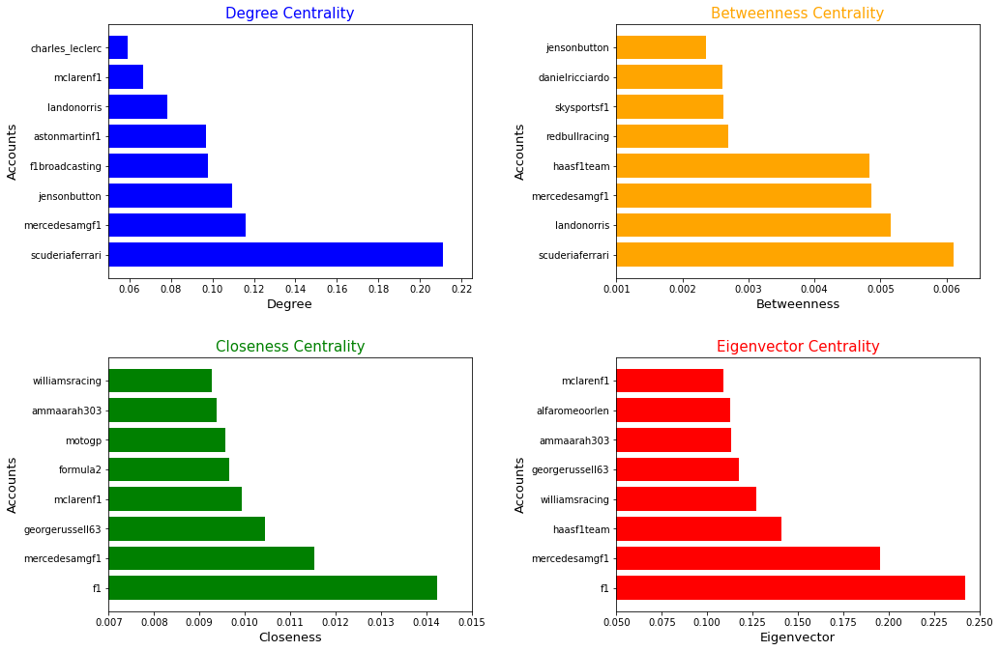

In [39]:
plot_barh(reply_network)

**From the horizontal bar graphs above we can observe:**
- **Degree Centrality --> Number of links a node has. We can see that the top two positions in this graph are occupied by prestigious teams Scuderia-Ferrari and Mercedes-AMG-Petronas.**
- **Betweenness Centrality --> Scuderia-Ferrari is the team that has the highest betweenness score. This could be due to their reputation of being the oldest F1 team to date and having raised world champions as well as won 16 Constructors' Championships. As a result, Ferrari connects more nodes as a bridge than any other node.**
- **Closeness Centrality --> We can see that in the Reply Network, accounts that have the highest closeness score are mostly team accounts or Formula1 official accounts as by nature, these accounts will have the most interactions.**
- **Eigenvector Centrality --> We can observe the most important (or popular) accounts are F1 in first and Mercedes-AMG-Petronas team account in the second. This reflects well in the overall relationships of Formula1 as accounts would follow F1 to get updates on the latest news as well as follow the Mercedes team which is a team that has dominated the grid for the last decade and won the Constructors' Championship 6 consecutive years between 2014-2021.**

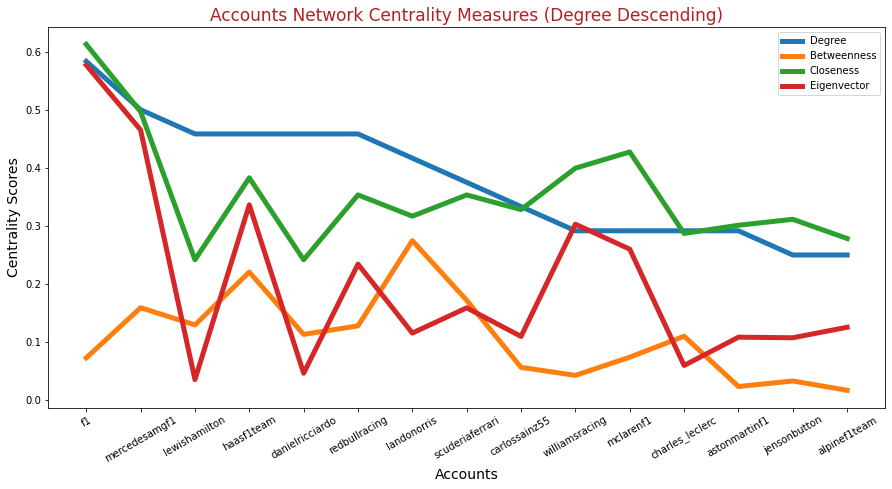

In [40]:
plt.figure(figsize=(15,7))
plt.plot(accounts_df_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Accounts Network Centrality Measures (Degree Descending)", fontsize=17, color="firebrick")
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30)
plt.show()

**The above graph depicts centrality measures for the Account Network as the degree scores get larger on the x-axis. We can observe similar trends between closeness and eigenvalue scores, however, this graph does not provide easy comparison within measures and rather even more confusing than the one before. For this, each centrality measure can be viewed below individually represented with accounts that have the highest scores.**

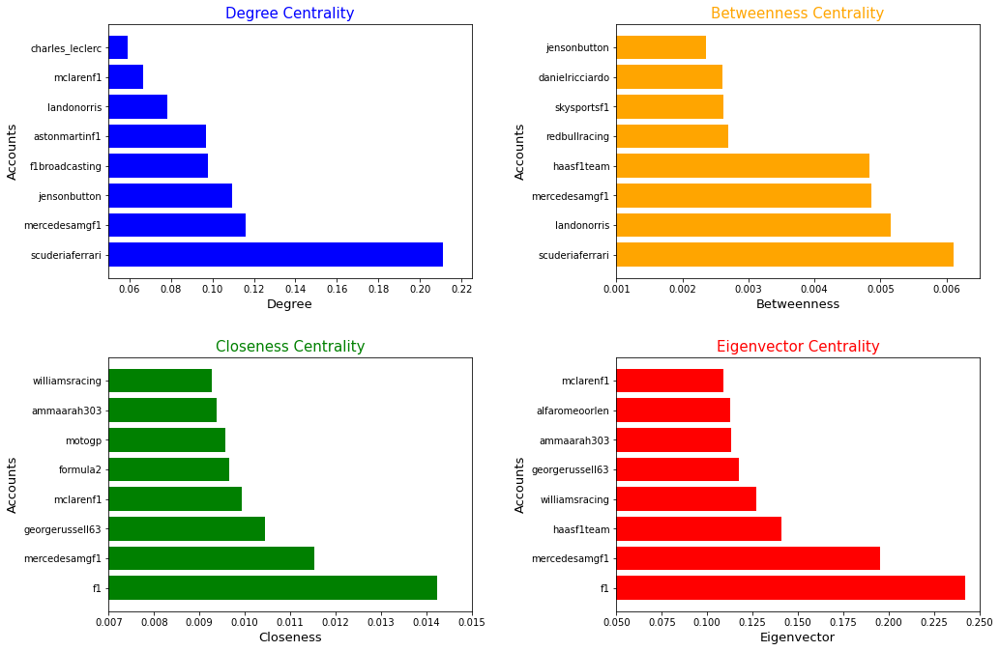

In [41]:
plot_barh(accounts_network)

**Foundings of the horizontal bar graphs above related to the Acccount Network matches the ones from Reply Network.**

## <u>Task 3 - Mention Network:</u>

**Mention network is created where (similar to the Reply Network) nodes are either users from your list or users from the wider Twitter platform - i.e. users who are not necessarily members of the list, but were mentioned in tweets by users on the list. Edges encode these mentions in tweets.**

In [42]:
initial_mention_network = nx.DiGraph()

for i, row in tweets_df.iterrows():
    if len(row["entities"]["user_mentions"]) > 0:
        for j in range(len(row["entities"]["user_mentions"])):
            for k in row["entities"]["user_mentions"][j]:
                if row["user"]["screen_name"] != row["entities"]["user_mentions"][j]["screen_name"]:
                    initial_mention_network.add_edge(row["user"]["screen_name"].lower(), row["entities"]["user_mentions"][j]["screen_name"].lower())

In [43]:
characteristics(initial_mention_network)

Number of Nodes: 2865, Number of Edges: 3975
Density:  0.0004844394395858317
Average Clustering Coefficient:  0.08537579147028439

Average In-Degree:  1.387434554973822
Average Out-Degree:  1.387434554973822

Number of strongly connected components:  2841
Number of weakly connected components:  1
Reciprocity:  0.03974842767295597


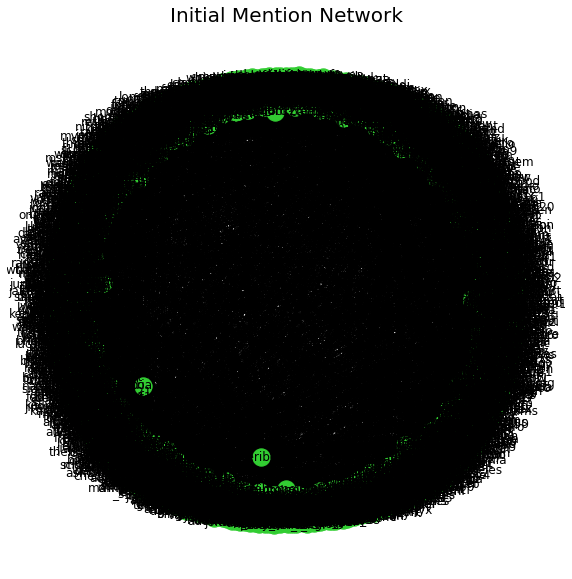

In [44]:
plt.figure(figsize=(10,10))
position = nx.spring_layout(initial_mention_network, k=3)
nx.draw_networkx(initial_mention_network, position, with_labels=True, node_size=300, node_color="limegreen")
plt.title(label="Initial Mention Network", fontsize=20)
plt.axis("off");

In [45]:
initial_mention_degrees = node_degree_distribution(initial_mention_network)
initial_mention_degrees.sort_values(ascending=False).head(10)

Range [minimum, maximum]: [1,423]
Mean (Average):  2.774869109947644
Median:  1.0


f1broadcasting     423
jensonbutton       341
fia                316
scuderiaferrari    284
lewishamilton      243
landonorris        225
danielricciardo    223
massafelipe19      213
charles_leclerc    207
mercedesamgf1      194
dtype: int64

**Here, a more detailed mention network is created from the initial mention network to better observe relationships in the F1 network while filtering accounts from the network created in Task 2. This provides us clarity in observing meaningful and consistent (not one-off) relationships.**

In [46]:
mention_network = nx.DiGraph()

for i, row in tweets_df.iterrows():
    if len(row["entities"]["user_mentions"]) > 0:
        for j in range(len(row["entities"]["user_mentions"])):
            for k in row["entities"]["user_mentions"][j]:
                if row["user"]["screen_name"] != row["entities"]["user_mentions"][j]["screen_name"] and row["entities"]["user_mentions"][j]["screen_name"] in account_names:
                    mention_network.add_edge(row["user"]["screen_name"].lower(), row["entities"]["user_mentions"][j]["screen_name"].lower())

In [47]:
characteristics(mention_network)

Number of Nodes: 27, Number of Edges: 303
Density:  0.43162393162393164
Average Clustering Coefficient:  0.5301463409678489

Average In-Degree:  11.222222222222221
Average Out-Degree:  11.222222222222221

Number of strongly connected components:  3
Number of weakly connected components:  1
Reciprocity:  0.5214521452145214


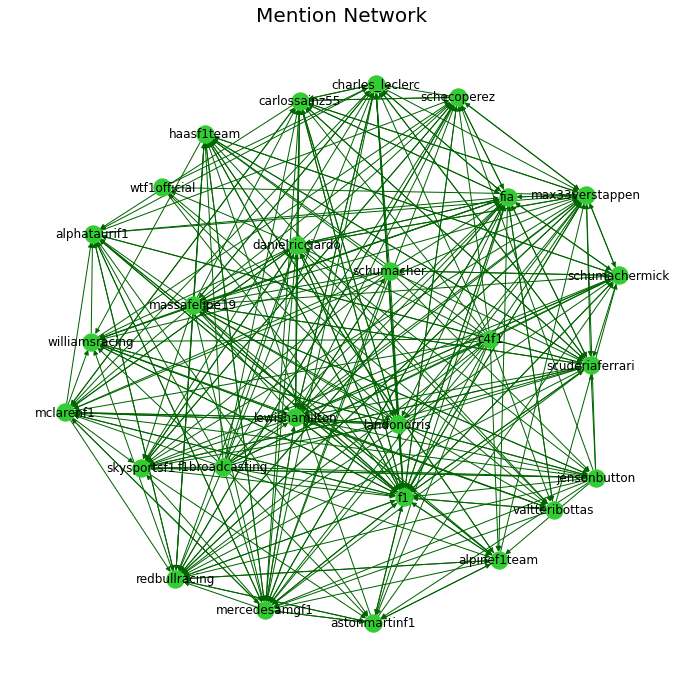

In [48]:
plt.figure(figsize=(12,12))
position = nx.spring_layout(mention_network, k=3)
nx.draw_networkx(mention_network, position, with_labels=True, node_size=300, node_color="limegreen", edge_color="darkgreen")
plt.title(label="Mention Network", fontsize=20)
plt.axis("off");

**When we observe the centralities of both networks, centralities are measured and sorted according to the "Betweenness" scores and the graphs below depicts how other centrality values change as the "Betweenness" value descends.**

In [49]:
initial_mention_c = centrality(initial_mention_network, "Betweenness")
initial_mention_corr = initial_mention_c.corr()

mention_c = centrality(mention_network, "Betweenness")
mention_corr = mention_c.corr()

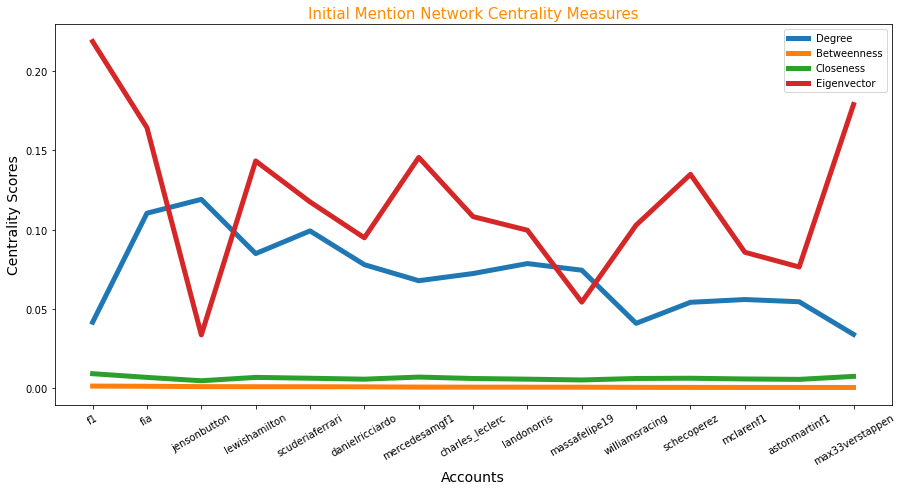

In [50]:
plt.figure(figsize=(15,7))
plt.plot(initial_mention_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Initial Mention Network Centrality Measures", fontsize=15, color="darkorange")
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30);

**From the graph above, we can make the observations about the initial mention network:**
- **Closeness and Betweenness follows similar trends where both measures' values descend and ascend more or less similarly for accounts (on the x-axis) in the graph.**
- **Degree and Eigenvector values are negatively correlated.**

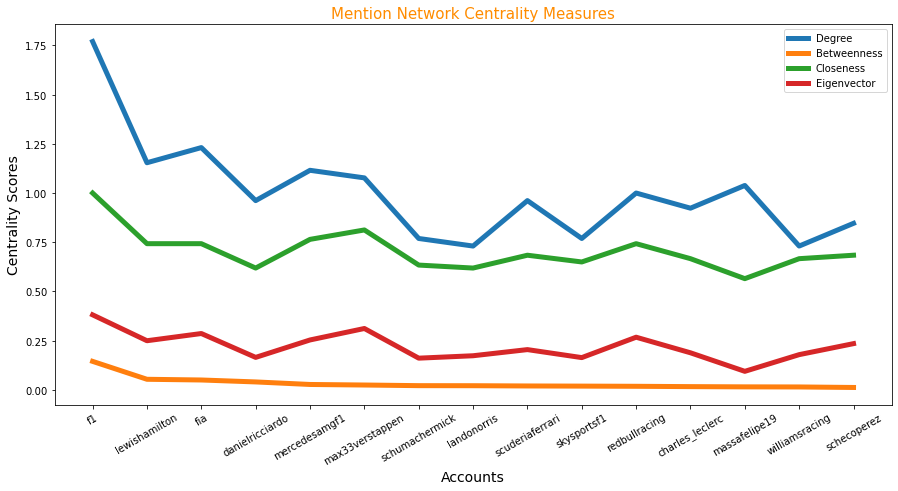

In [51]:
plt.figure(figsize=(15,7))
plt.plot(mention_c, linewidth=5)
plt.xlabel("Accounts", fontsize=14)
plt.ylabel("Centrality Scores", fontsize=14)
plt.title("Mention Network Centrality Measures", fontsize=15, color="darkorange")
plt.gca().legend(("Degree", "Betweenness", "Closeness", "Eigenvector"))
plt.xticks(rotation=30);

**From the graph above, we can observe that as the Betweenness values descend, Degree, Closeness and Eigenvalue scores follows similar trends where these scores descend and ascend similarly for each account (on the x-axis) in the graph.**

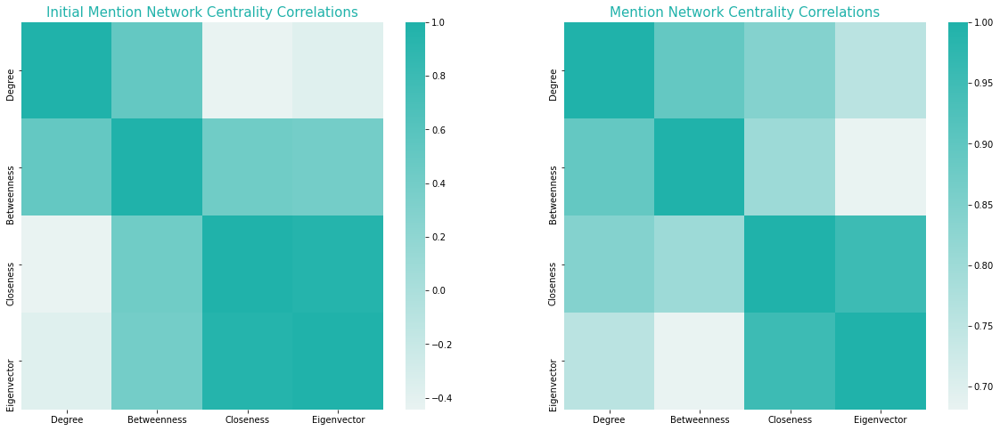

In [52]:
fig, (ax5, ax6) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), sharex=True)
sns.heatmap(data=initial_mention_corr, cmap=sns.light_palette("lightseagreen", as_cmap=True), ax=ax5)
ax5.set_title("Initial Mention Network Centrality Correlations", fontsize=15, color="lightseagreen")
sns.heatmap(data=mention_corr, cmap=sns.light_palette("lightseagreen", as_cmap=True), ax=ax6)
ax6.set_title("Mention Network Centrality Correlations", fontsize=15, color="lightseagreen");

**From the heatmaps above, we can confirm and validate the foundings above in the graphs. In the initial mention network's centrality measures graph, Betweenness and Closeness were found to be positively correlated and Degree and Eigenvalue were found to be negatively correlated. We can confirm this from the heatmap on the left and further analyse that Betweenness and Degree are also positively correlated which was not as obvious to observe from the linegraphs due to different ranges of precision. From the heatmap on the right, we can confirm the above statement related to the trends of the mention network's centrality measures where Degree, Closeness and Eigenvalue scores are positively correlated.**

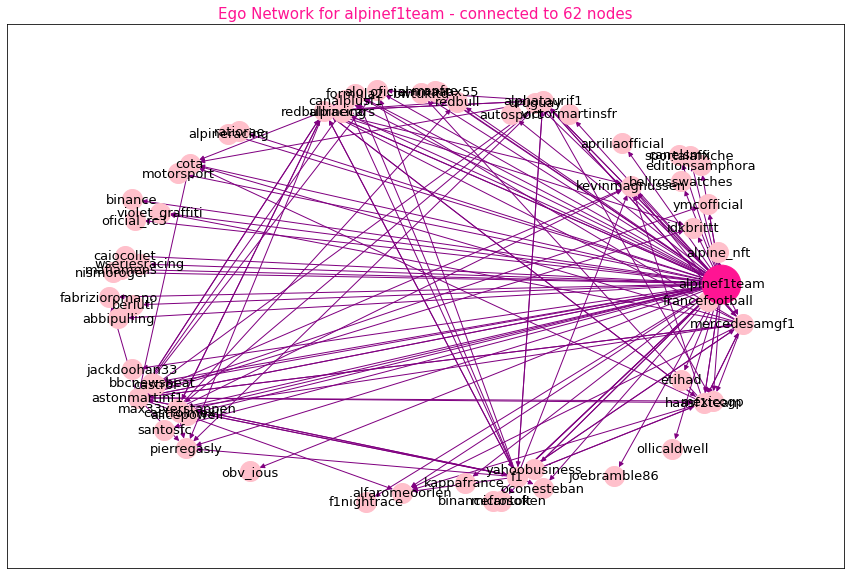

alpinef1team is connected to: 
['jackdoohan33', 'caiocollet', 'microsoft', 'haasf1team', 'canalplusf1', 'autosport', 'bellrosswatches', 'oconesteban', 'castrol', 'apriliaofficial', 'alo_oficial', 'pierregasly', 'f1', 'astonmartinf1', 'alpine_nft', 'alpinecars', 'obv_ious', 'alicepowell', 'mafiamens', 'santosfc', 'binance', 'binancefantoken', 'sportalaffiche', 'francefootball', 'kevinmagnussen', 'cota', 'mapfre', 'alfaromeoorlen', 'etihad', 'kappafrance', 'uruguay', 'joebramble86', 'bwtukltd', 'mexicogp', 'alpineracing', 'canelsmx', 'wseriesracing', 'violet_graffiti', 'fabrizioromano', 'formula2', 'ollicaldwell', 'yahoobusiness', 'emmaaax55', 'f1nightrace', 'idkbrittt', 'nismoroger', 'motorsport', 'ratiorae', 'editionsamphora', 'redbullracing', 'ymcofficial', 'victormartinsfr', 'alphataurif1', 'redbull', 'max33verstappen', 'oficial_rc3', 'bbcnewsbeat', 'abbipulling', 'castrolmex', 'mercedesamgf1', 'berluti']


In [53]:
egocentric(initial_mention_network, "alpinef1team")

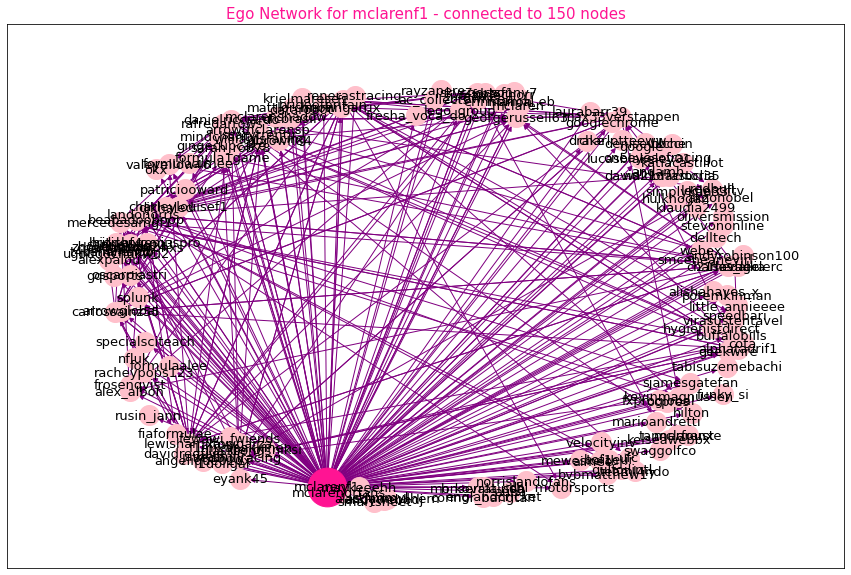

mclarenf1 is connected to: 
['andyrobinson100', 'sarah_rob78', 'patriciooward', 'mclarenshadow', 'lucasblakeley01', 'speedbari', 'gingecupcake', 'cota', 'landonorris', 'danielricciardo', 'klaudia2499', 'angelique020x', 'djkhaled', 'nfluk', 'f1', 'martingarrix', 'medallia', 'drake', 'valeyellow46', 'googlechrome', 'google', 'hilton', 'oscarpiastri', 'arrowmclarensp', 'waldorfastoria', 'charles_leclerc', 'charlotteeww', 'mclarenxe', 'leclerclftv', 'specialsciteach', 'swaggolfco', 'beabadooboop', 'delltech', 'stjimmyl', 'smceneaneyirl', 'zbrownceo', 'velocityinv', 'f1mikahakkinen', 'marioandretti', 'connor_bangtan', 'andywebbdj', 'monserrat_ssa', 'alex_albon', 'jameshify', 'sonny7', 'nba', 'tannerfoust', 'alexpalou', 'little_annieeee', 'meweskeith', 'alasdairmulhern', 'david21dacmcl35', 'sannexx2003', 'hiddengeniuspro', 'smartsheet', 'gulfoilintl', 'gbrown84', 'okx', 'andamh_', 'teaml4ndo', 'rafredarrows', 'mindcharity', 'racheypops123', 'laurabarr39', 'datarobot', 'mercedesamgf1', 'david

In [54]:
egocentric(initial_mention_network, "mclarenf1")

**Here two competitive middle-field teams' online presence and network relationships are compared: Alpine-Renault (4th in the 2022 Constructor's Championship) and McLaren (5th in the 2022 Constructor's Championship). From their Initial Mention Network presence above, we can observe that McLaren (connected to: 150) has a stronger relationships in the network than Alpine (connected to: 62). This indicates that McLaren might have a more active fanbase or stronger relationships within the sport which will be investigated as we analyse the Mention Network below.**

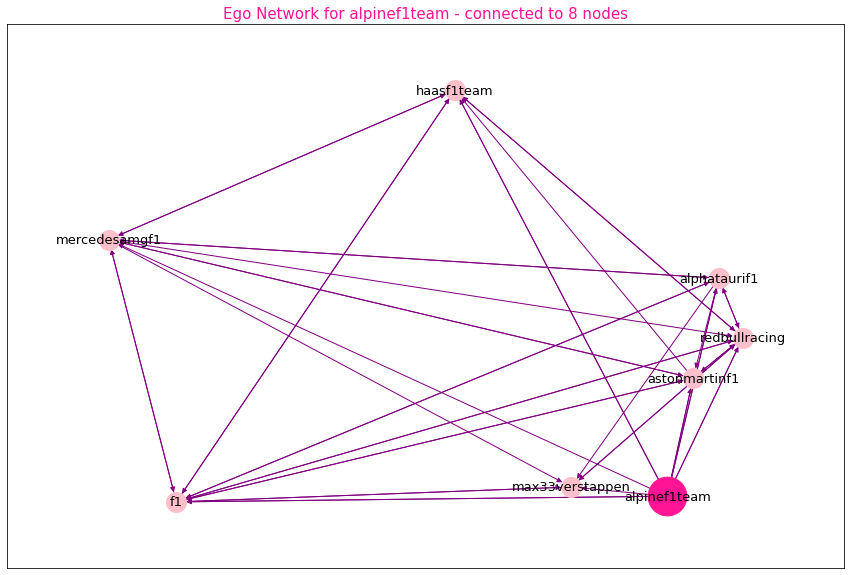

alpinef1team is connected to: 
['haasf1team', 'f1', 'astonmartinf1', 'redbullracing', 'alphataurif1', 'max33verstappen', 'mercedesamgf1']


In [55]:
egocentric(mention_network, "alpinef1team")

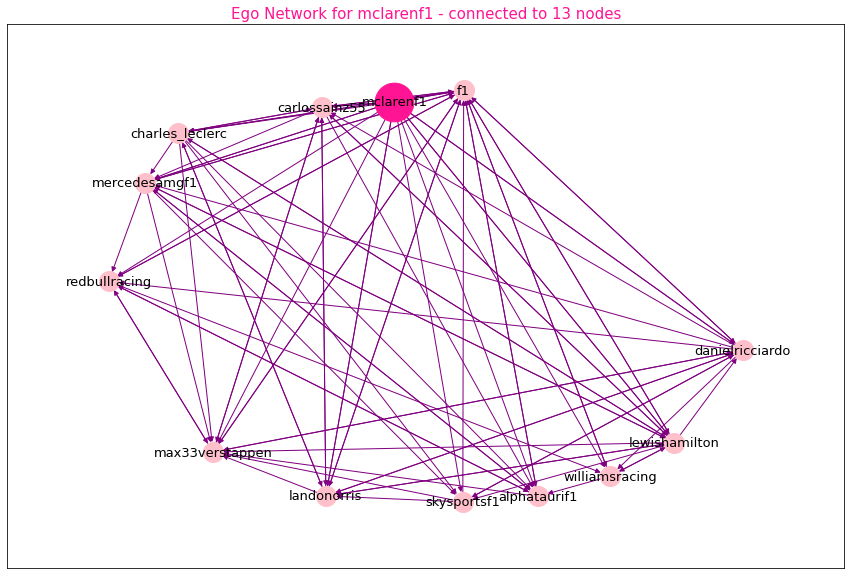

mclarenf1 is connected to: 
['landonorris', 'danielricciardo', 'f1', 'charles_leclerc', 'mercedesamgf1', 'redbullracing', 'alphataurif1', 'carlossainz55', 'lewishamilton', 'max33verstappen', 'skysportsf1', 'williamsracing']


In [56]:
egocentric(mention_network, "mclarenf1")

**From the teams' Mention Network presence, we can observe that McLaren (connected to: 13) has a stronger relationships in the network than Alpine (connected to: 8). We can confirm that McLaren has a more dominant presence in the F1 network (Mention Network) as well as the network that is open to general public (Initial Mention Network).**

## <u>Task 4 - User-Hashtag Network:</u>

**A bipartite network is created below where one set of nodes represents the users from your list, and the other set of nodes will represents the hashtags which appear in their tweets. Edges encode the user-hashtag relations.**

In [57]:
pairs = [] 

for i, row in tweets_df.iterrows():
    if len(row["entities"]["hashtags"]) > 0:
        for j in range(len(row["entities"]["hashtags"])):
            for k in row["entities"]["hashtags"][j]:
                pairs.append((row["user"]["screen_name"].lower(), "#{}".format((row["entities"]["hashtags"][j]["text"]).lower())))

In [58]:
from networkx.algorithms import bipartite
hashtag_network = nx.Graph()
account_nodes, hashtag_nodes = set(), set()

for pair in pairs:
    account = pair[0]
    hashtag = pair[1]    
    
    if not account in account_nodes:
        hashtag_network.add_node(account, bipartite=0)
        account_nodes.add(account)
    if not hashtag in hashtag_nodes:
        hashtag_network.add_node(hashtag, bipartite=1)
        hashtag_nodes.add(hashtag)    
    
    hashtag_nodes.add(hashtag)
    hashtag_network.add_edge(account, hashtag)
    
if bipartite.is_bipartite(hashtag_network):
    print("Created bipartite network with %d nodes and %d edges" % (hashtag_network.number_of_nodes(), hashtag_network.number_of_edges()))

Created bipartite network with 1569 nodes and 2303 edges


In [59]:
accounts_set, hashtags_set = bipartite.sets(hashtag_network)

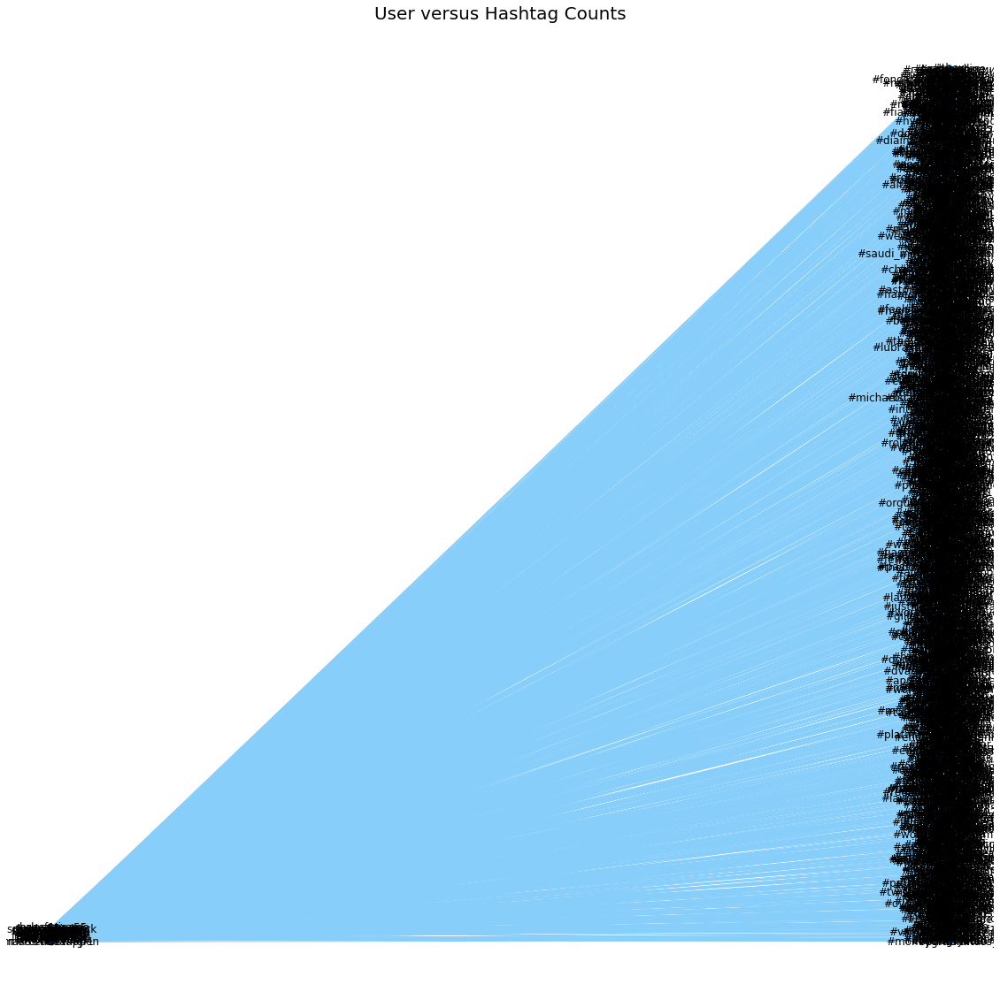

In [60]:
colormap, position = {}, {}
for i, node in enumerate(account_nodes):
    position[node] = (0, i*10)
    colormap[node] = "#1a569a"
for i, node in enumerate(hashtag_nodes):
    position[node] = (0.5, i*10)
    colormap[node] = "#069AF3"
colors = [colormap[node] for node in hashtag_network.nodes()]

plt.figure(figsize=(20,20))
nx.draw_networkx(hashtag_network, pos=position, with_labels=True, node_size=50, edge_color="lightskyblue", node_color=colors)
plt.title("User versus Hashtag Counts", fontsize=20)
plt.axis("off")
plt.show()

**It can be confirmed from the depiction above that the number of accounts (users) is smaller than the number of hashtags.**

In [61]:
hashtag_degrees = dict(hashtag_network.degree(account_nodes))
hashtag_s = pd.Series(hashtag_degrees)
hashtag_df = pd.DataFrame({"Degree" : hashtag_s})
hashtag_df.sort_values(by="Degree", ascending=False).head(10)

,Degree
schecoperez,221
fia,202
jensonbutton,190
danielricciardo,175
max33verstappen,158
valtteribottas,155
lewishamilton,139
massafelipe19,122
schumachermick,117
schumacher,108


**The layout of the bipartite network is adjusted to display accounts and different hashtags they use.**

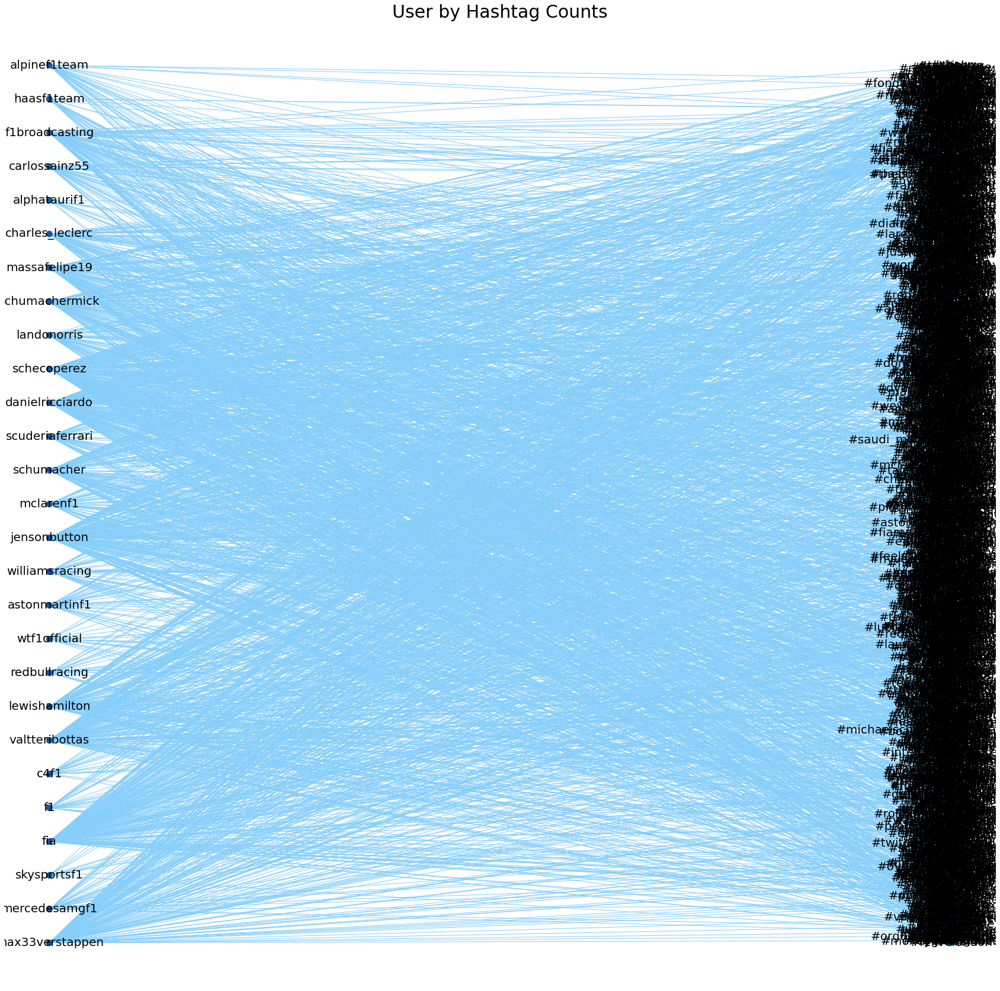

In [62]:
pos = nx.bipartite_layout(hashtag_network, account_nodes)
color_map2 = {}

for i, node in enumerate(account_nodes):
    color_map2[node] = "#1a569a"
for i, node in enumerate(hashtag_nodes):
    color_map2[node] = "#069AF3"

colors = [color_map2[node] for node in hashtag_network.nodes()]

plt.figure(figsize=(30,30))
nx.draw_networkx(hashtag_network, pos=pos, with_labels=True, node_size=100, edge_color="lightskyblue", node_color=colors, font_size=20)
plt.title("User by Hashtag Counts", fontsize=30)
plt.axis("off");

**To further analyse the trend of hashtags used by accounts, ego networks are created for the F1 team "scuderiaferrari" and its two drivers "charles_leclerc" and "carlossainz55" in the 2022 season. From the graph below, we can see that Ferrari's team account mostly uses hashtags for the upcoming or past Grand Prixs with also mentioning drivers with hashtags such as #carlos55 and #charles16. However, we can see that the account's main focus is on giving team updates about Grand Prixs.**

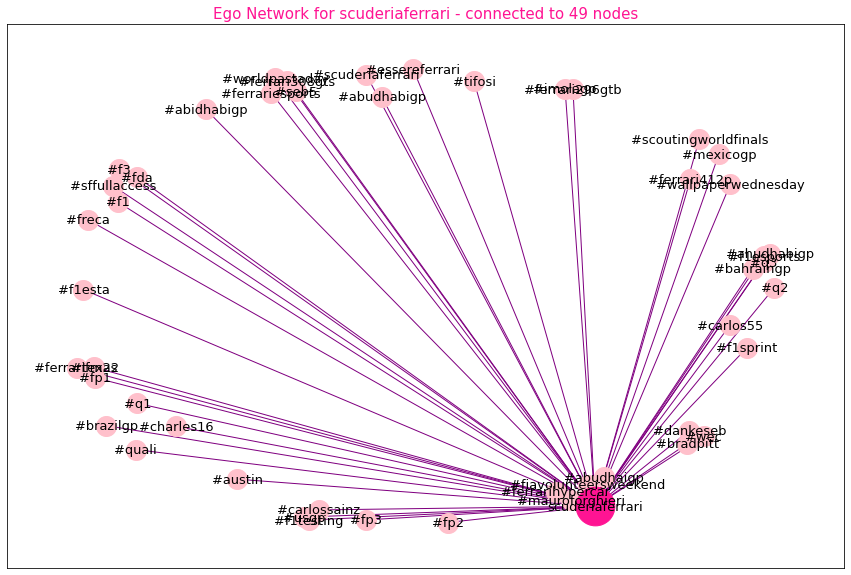

scuderiaferrari is connected to: 
['#essereferrari', '#brazilgp', '#tifosi', '#abudhabigp', '#usgp', '#ahudhabigp', '#f1sprint', '#seb5', '#fp2', '#mexicogp', '#f1esta', '#wallpaperwednesday', '#fp1', '#fp3', '#abudhaigp', '#ferrarihypercar', '#wec', '#sffullaccess', '#q2', '#q3', '#f1', '#fiavolunteersweekend', '#f1testing', '#bradpitt', '#ferrari296gtb', '#quali', '#carlossainz', '#q1', '#fda', '#f1esports', '#ferrariesports', '#charles16', '#carlos55', '#texas', '#scuderiaferrari', '#ferrari308gts', '#abidhabigp', '#worldpastaday', '#imolagp', '#dankeseb', '#freca', '#f3', '#ferrarifm22', '#austin', '#scoutingworldfinals', '#bahraingp', '#mauroforghieri', '#ferrari412p']


In [63]:
egocentric(hashtag_network, "scuderiaferrari")

**Below we can view charles_leclerc's account's hashtags where again Grand Prixs are mostly mentioned, however, we can also see that this account shares personal updates (with hashtags such as #valentinesday or #funnyface) as well as supports political movements (with hashtags such as #solidarity or #blacklivesmatter).**

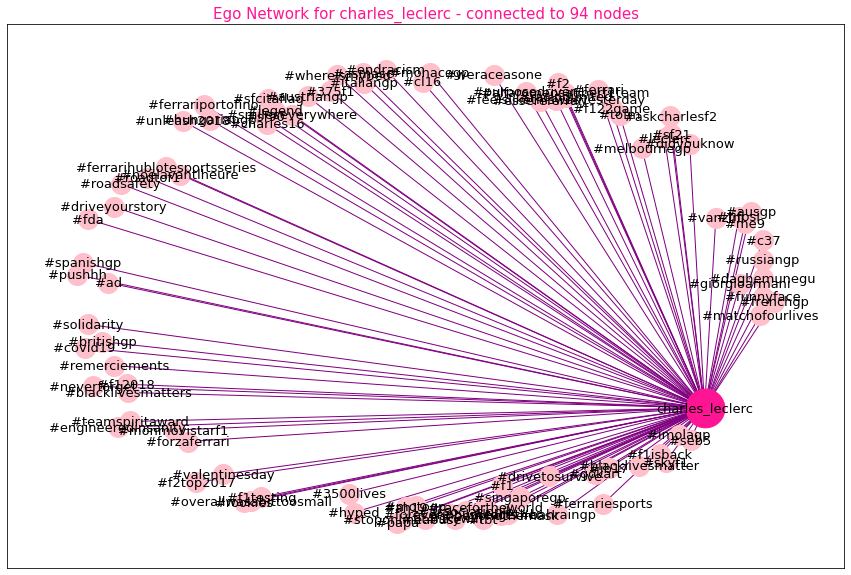

charles_leclerc is connected to: 
['#sf21', '#f1', '#charles16', '#essereferrari', '#f1testing', '#fit4f1', '#russiangp', '#asmasc', '#unleash2018', '#pushhh', '#forzaferrari', '#askcharlesf2', '#melbournegp', '#noëlavantlheure', '#ferrari', '#racefortheworld', '#spanishgp', '#monacogp', '#bahraingp', '#ferrarihublotesportsseries', '#ferrariesports', '#sfcitaflag', '#drivetosurvive', '#frenchgp', '#motogp', '#britishgp', '#f122game', '#ferrariportofino', '#tofm', '#teamspiritaward', '#f2', '#roadsafety', '#cl16', '#vanzini', '#ausgp', '#austriangp', '#endracism', '#jb17', '#gokart', '#associationjb', '#neverforget', '#covid19', '#3500lives', '#imolagp', '#funnyface', '#legend', '#giorgioarmani', '#tifosi', '#ah19', '#alfaromeosauberf1team', '#c37', '#blacklivesmatter', '#matchofourlives', '#solidarity', '#together', '#foreverinourhearts', '#singaporegp', '#rookies', '#375f1', '#fda', '#skywifi', '#ad', '#seb5', '#hyped', '#skyf1', '#stoponlineabuse', '#leclerc', '#purposedriven', '#hun

In [64]:
egocentric(hashtag_network, "charles_leclerc")

**From carlossainz55's account below, we can see hashtags where again Grand Prixs are mentioned, however, this account is a lot more focused on personal updates (hashags: #snapchat, #makegolfyourthing, #worldphotographyday...) and cultural interactions (#correporelniño, #somosespaña...). We can conclude that the social media presence of Ferrari and its drivers have Grand Prixs and the overall team spirit (#essereferrari) in common.**

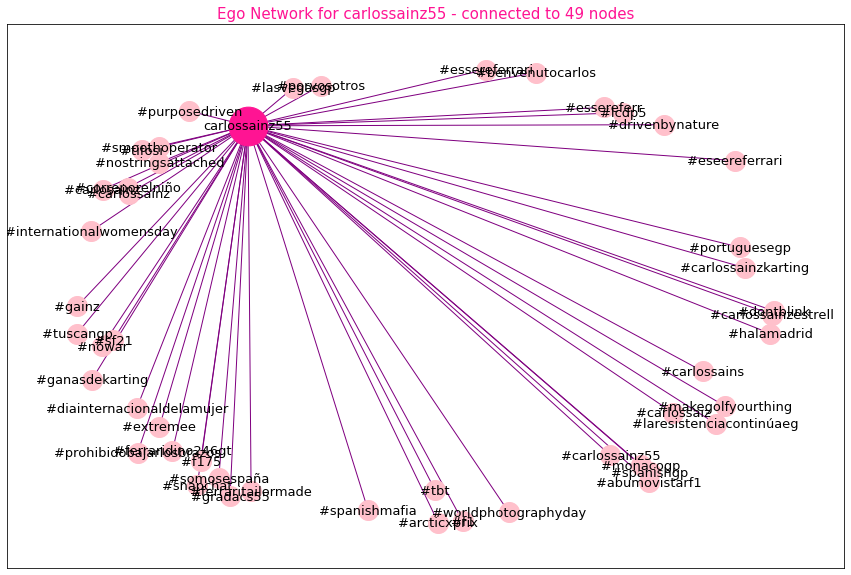

carlossainz55 is connected to: 
['#carlossainz', '#essereferrari', '#halamadrid', '#sf21', '#f1', '#snapchat', '#porvosotros', '#gainz', '#dontblink', '#gradacs55', '#spanishgp', '#smoothoperator', '#lcdp5', '#carlossains', '#benvenutocarlos', '#purposedriven', '#nowar', '#nostringsattached', '#carlossainz55', '#laresistenciacontinúaeg', '#f175', '#essereferr', '#carlosainz', '#worldphotographyday', '#ferraridino246gt', '#makegolfyourthing', '#monacogp', '#tifosi', '#correporelniño', '#prohibidobajarlosbrazos', '#tuscangp', '#drivenbynature', '#somosespaña', '#diainternacionaldelamujer', '#internationalwomensday', '#carlossainzkarting', '#ganasdekarting', '#carlossainzestrell', '#tbt', '#spanishmafia', '#ferraritailormade', '#abumovistarf1', '#eseereferrari', '#lasvegasgp', '#carlossaiz', '#extremee', '#arcticxprix', '#portuguesegp']


In [65]:
egocentric(hashtag_network, "carlossainz55")

## <u>Task 5 - Hashtag Co-occurrence Network:</u>

**Networks are created where each node corresponds to a hashtag appearing in one or more of the tweets. Edges represent the co-occurrence of hashtags in the same tweets.**

**Below, the hashtag cooccurrence network is created using a dictionary "hashtags_by_user" which stores a list of hashtags for each tweet's user ID. As we iterate through the "tweets_df" dataframe, if the current row has at least one hashtag, this list of hashtags are formatted and appended to a list called tmp (which is initialised as an empty list). "tmp" is then assigned as the value to the "hashtags_by_user", with the tweet's user ID as the key. For each pair of hashtaghs, if the pair already exists in the "cooccurrence_network", the weight of the edge between them is incremented by one. Otherwise, a new edge is added to cooccurrence_network between the two hashtags with a weight of one.**

In [66]:
hashtags_by_user = {} 
for i, row in tweets_df.iterrows():
    if len(row["entities"]["hashtags"]) > 0:
        tmp = []
        for j in range(len(row["entities"]["hashtags"])):
            tmp.append("#{}".format((row["entities"]["hashtags"][j]["text"]).lower()))
        hashtags_by_user[row["id"]] = tmp

In [67]:
cooccurrence_network = nx.Graph()

for h in hashtags_by_user:
    for pair in itertools.combinations(hashtags_by_user[h], r=2):
        if cooccurrence_network.has_edge(pair[0], pair[1]):
            cooccurrence_network[pair[0]][pair[1]]["weight"] += 1
        else:
            cooccurrence_network.add_edge(pair[0], pair[1], weight=1)

In [68]:
weights = Counter()

for edge in cooccurrence_network.edges(data=True):
    key = "%s, %s" % (edge[0], edge[1])
    weights[key] = edge[2]["weight"]

In [69]:
characteristics(cooccurrence_network)

Number of Nodes: 1140, Number of Edges: 2691
Density:  0.004144910124301095
Average Clustering Coefficient:  0.5017014412355262
Diameter: 9, Average Shortest Path: 3.7502936702936704


In [70]:
cooccurrence_degrees = node_degree_distribution(cooccurrence_network)
cooccurrence_degrees.sort_values(ascending=False).head(10)

Range [minimum, maximum]: [1,256]
Mean (Average):  4.721052631578948
Median:  2.0


#f1                256
#vb77              134
#essereferrari      65
#haasf1             61
#usgp               59
#brazilgp           58
#keeppushing        56
#abudhabigp         53
#mexicogp           53
#unleashthelion     49
dtype: int64

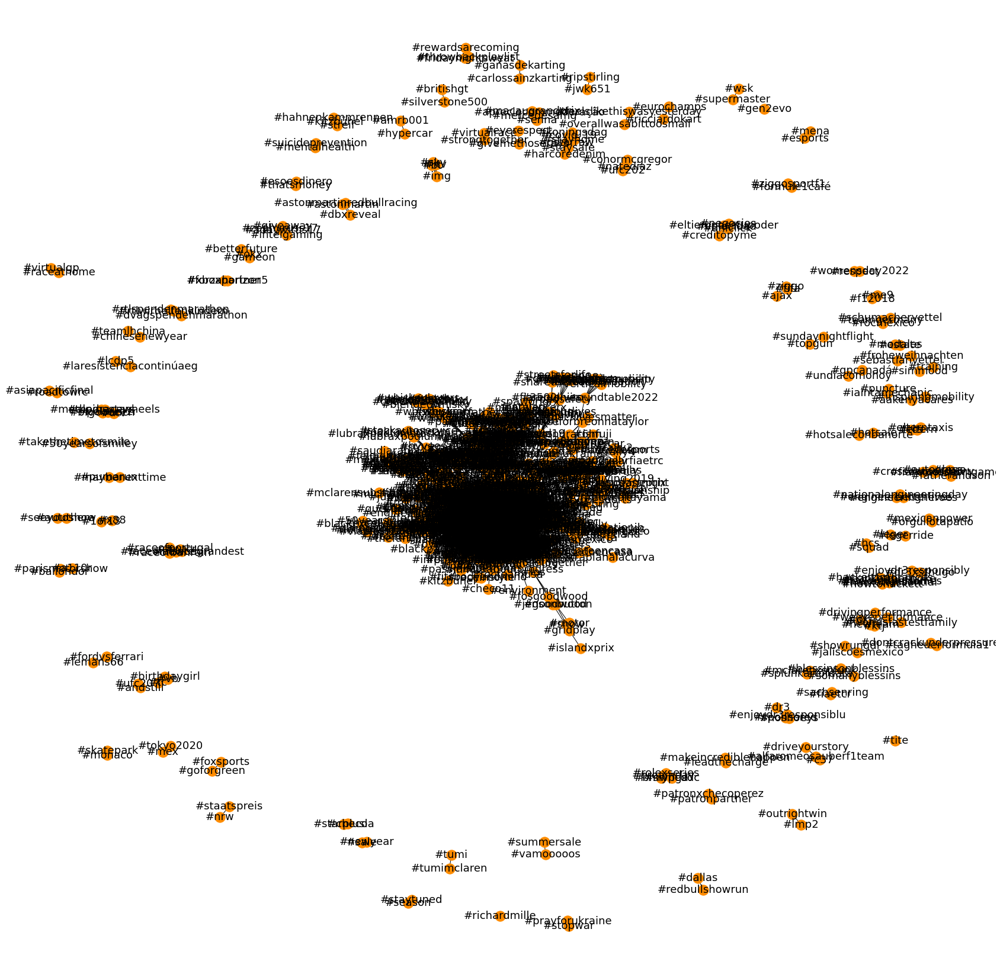

In [71]:
plt.figure(figsize=(30,30))
nx.draw_networkx(cooccurrence_network, with_labels=True, node_color="darkorange", font_size=18)
labels = nx.get_edge_attributes(cooccurrence_network, "weight")
plt.axis("off");

**From the network above, we can see hashtags that appear together connected in their own clusters. As it is quite hard to make assumptions and analyse trends from this visual, hashtag cooccurrences will be further investigated below. However, as an initial analysis, we can see that the large cluster in the middle represents hashtags related to teams, drivers, Grand Prixs, regulations and changes in the sport over the years (due to COVID19 etc). Small clusters around are mostly related to individual events or unique organisations (such as #womensday2022 and #respect).**

**Similarly to the one above, networks are created where each node corresponds to a hashtag appearing in one or more of the tweets. However, now we can associate weights related to these hashtags which will allow us to detect important hashtags or hashtags that are mostly used together. A second weighed network is created to filter weights where hashtags are commonly used together to provide better understanding and scope.**

In [72]:
user_names = set()
for i, row in tweets_df.iterrows():
    user_names.add(row["user"]["screen_name"].lower())

In [73]:
hashtag_map = {}
for i, row in tweets_df.iterrows():
    if row["user"]["screen_name"] in user_names and len(row["entities"]["hashtags"]) > 0:
        lst = []
        for j in range(len(row["entities"]["hashtags"])):
            lst.append("#{}".format((row["entities"]["hashtags"][j]["text"]).lower()))
        hashtag_map[row["id"]] = lst

In [74]:
pair_counts = Counter()

for c in hashtag_map:
    hashtag_pairs = list(itertools.combinations(hashtag_map[c], r=2))
    for pair in hashtag_pairs:
        pair_counts[pair] += 1

In [75]:
cooccurrence_n = nx.Graph()
weighted_cooccurrence_n = nx.Graph()

for pair in pair_counts:
    cooccurrence_n.add_edge(pair[0], pair[1], weight=pair_counts[pair])
    if pair_counts[pair] > 3:
        weighted_cooccurrence_n.add_edge(pair[0], pair[1], weight=pair_counts[pair])

In [76]:
cooccurrence_df = nx.to_pandas_edgelist(cooccurrence_n)
cooccurrence_df = cooccurrence_df.sort_values(by="weight", ascending=False).head(20)

weighted_cooccurrence_df = nx.to_pandas_edgelist(weighted_cooccurrence_n)
weighted_cooccurrence_df = weighted_cooccurrence_df.sort_values(by="weight", ascending=False).head(20)

In [77]:
characteristics(cooccurrence_n)

Number of Nodes: 370, Number of Edges: 762
Density:  0.011162381894089211
Average Clustering Coefficient:  0.5004897796545394
Diameter: 11, Average Shortest Path: 3.9811642094560242


In [78]:
cooccurrence_degrees = node_degree_distribution(cooccurrence_n)
cooccurrence_degrees.sort_values(ascending=False).head(10)

Range [minimum, maximum]: [1,92]
Mean (Average):  4.118918918918919
Median:  2.0


#f1                   92
#wrc                  29
#fiapuremotorsport    27
#skyf1                26
#womeninmotorsport    25
#fiaautocross         25
#teammichael          21
#formula4             21
#keepfighting         17
#f4                   16
dtype: int64

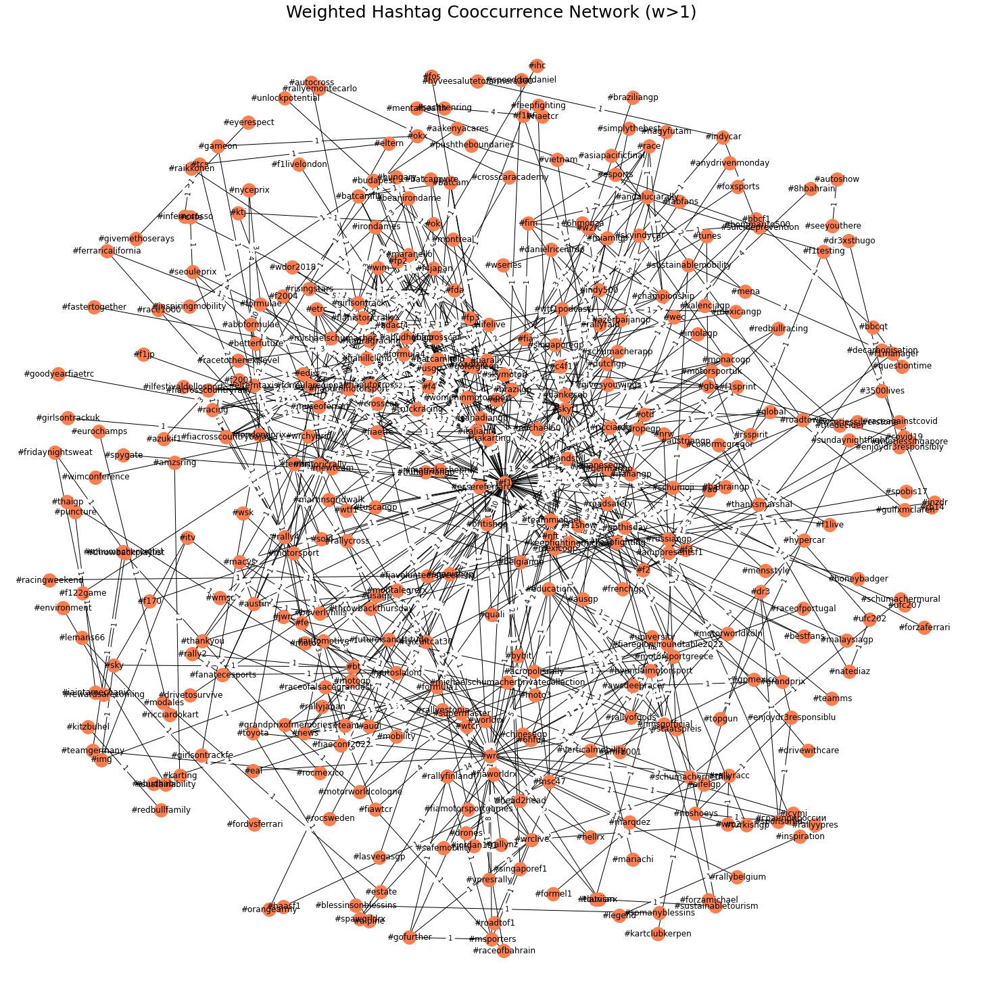

In [79]:
plt.figure(figsize=(20,20)) 
pos = nx.spring_layout(cooccurrence_n, k=0.4)
nx.draw(cooccurrence_n, pos, with_labels = True, node_size=400, font_size=12, node_color="coral")
labels = nx.get_edge_attributes(cooccurrence_n, "weight")
nx.draw_networkx_edge_labels(cooccurrence_n, pos, edge_labels=labels)
plt.title("Weighted Hashtag Cooccurrence Network (w>1)", fontsize=25);

In [80]:
characteristics(weighted_cooccurrence_n)

Number of Nodes: 56, Number of Edges: 52
Density:  0.033766233766233764
Average Clustering Coefficient:  0.15129490392648287
Diameter: 2, Average Shortest Path: 1.3333333333333333


In [81]:
w_cooccurrence_degrees = node_degree_distribution(weighted_cooccurrence_n)
w_cooccurrence_degrees.sort_values(ascending=False).head(10)

Range [minimum, maximum]: [1,19]
Mean (Average):  1.8571428571428572
Median:  1.0


#f1              19
#wrc              7
#skyf1            6
#britishgp        4
#teammichael      3
#brazilgp         3
#abbformulae      3
#f1sprint         2
#keepfighting     2
#michael50        2
dtype: int64

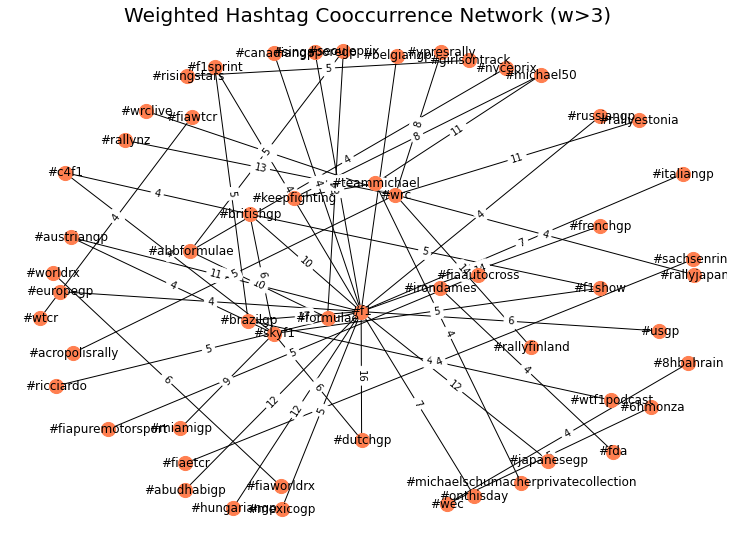

In [82]:
plt.figure(figsize=(10,7)) 
pos = nx.spring_layout(weighted_cooccurrence_n, k=2)
nx.draw(weighted_cooccurrence_n, pos, with_labels = True, node_size=200, font_size=12, node_color="coral")
labels = nx.get_edge_attributes(weighted_cooccurrence_n, "weight")
nx.draw_networkx_edge_labels(weighted_cooccurrence_n, pos, edge_labels=labels)
plt.title("Weighted Hashtag Cooccurrence Network (w>3)", fontsize=20);

In [83]:
cooccurrence_degree = node_degree_distribution(cooccurrence_n)
weightedCo_degree = node_degree_distribution(weighted_cooccurrence_n)

Range [minimum, maximum]: [1,92]
Mean (Average):  4.118918918918919
Median:  2.0
Range [minimum, maximum]: [1,19]
Mean (Average):  1.8571428571428572
Median:  1.0


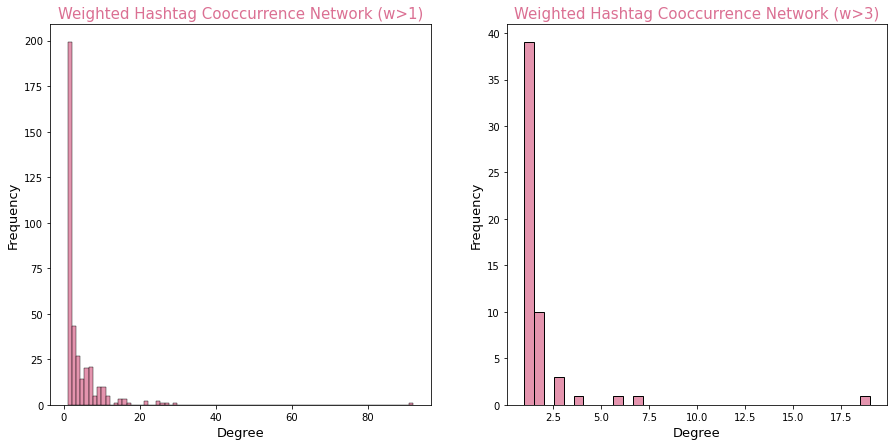

In [84]:
fig, (ax7, ax8) = plt.subplots(nrows=1, ncols=2, figsize=(15,7))

sns.histplot(data=cooccurrence_degree, color="palevioletred", ax=ax7)
ax7.set_xlabel("Degree", fontsize=13)
ax7.set_ylabel("Frequency", fontsize=13)
ax7.set_title(label="Weighted Hashtag Cooccurrence Network (w>1)", fontsize=15, color="palevioletred")

sns.histplot(data=weightedCo_degree, color="palevioletred", ax=ax8)
ax8.set_xlabel("Degree", fontsize=13)
ax8.set_ylabel("Frequency", fontsize=13)
ax8.set_title(label="Weighted Hashtag Cooccurrence Network (w>3)", fontsize=15, color="palevioletred")

plt.show()

**From above, we can observe that the number of hashtag occurrences where weight>1 are higher than the number of hashtag occurrences where weight>3. This outcome of having higher frequency scores for the network with weights greater than 1 can naturally be predicted from the way we added pairs to the network (filtered weights from the network on the right to create the network on the left), however, it is also confirmed from the histograms above.**

In [85]:
common = weights.most_common()
common_edges = common[:10]
edge_name, occurances = [], []

for e in range(len(common_edges)):
    edge_name.append(common_edges[e][0])
    occurances.append(common_edges[e][1])

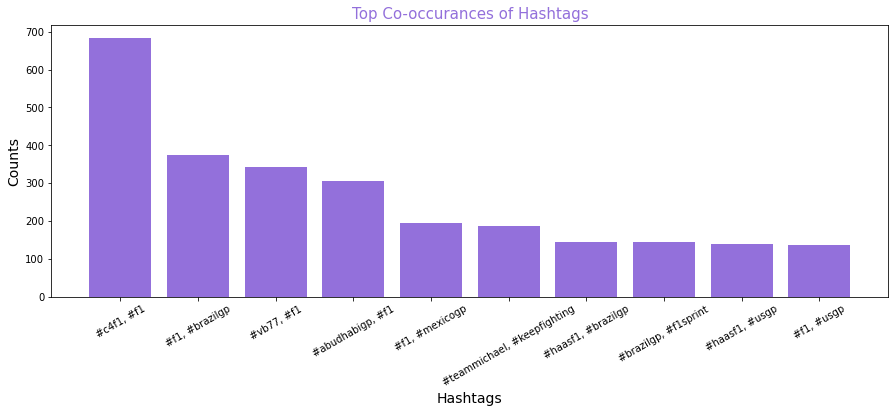

In [86]:
plt.figure(figsize=(15,5))
plt.bar(edge_name, occurances, color="mediumpurple")
plt.xlabel("Hashtags", fontsize=14)
plt.ylabel("Counts", fontsize=14)
plt.title("Top Co-occurances of Hashtags", fontsize=15, color="mediumpurple")
plt.xticks(rotation=30, fontsize=10);

**We can observe above that hashtags related to teams (such as #haasf1) and Grand Prixs (such as #usgp, #brazilgp, #mexicogp) are frequently used with the hashtag #f1.**

## <u>Task 6 - Dynamic Follower Network:</u>

**Using the timestamp information which indicates when each user started following the other user, time window networks representing the evolution of follower relations are construct and characterised.**

In [87]:
print("Timestamp Range [start, stop]: ", data["date"].min(), data["date"].max())

Timestamp Range [start, stop]:  2020-01-05 00:00:00 2022-12-27 00:00:00


In [88]:
years = list(range(2020,2023))
window_frames = {}

for year in years:
    win_start = datetime(year, 1, 1)
    win_end = datetime(year, 12, 31 )
    window_frames[year] = data[(data["date"] >= win_start) & (data["date"] <= win_end)]
    print("Window %d: %s <= Date < %s -> %d follows" % (year, win_start.date(), win_end.date(), len(window_frames[year])))

Window 2020: 2020-01-01 <= Date < 2020-12-31 -> 204 follows
Window 2021: 2021-01-01 <= Date < 2021-12-31 -> 131 follows
Window 2022: 2022-01-01 <= Date < 2022-12-31 -> 103 follows


In [89]:
def draw_window_networks(year):
    window_networks = {}
    
    for year in years:
        g = nx.from_pandas_edgelist(window_frames[year], "source", "target", create_using=nx.DiGraph()) 
        window_networks[year] = g
    
        plt.figure(figsize=(10,7)) 
        pos = nx.circular_layout(window_networks[year])
        nx.draw(window_networks[year], pos, with_labels = True, node_size=800, font_size=12, node_color="turquoise", edge_color="dodgerblue")
        title = "Window " + str(year) + " - " + str(g.number_of_nodes()) + " nodes & " + str(g.number_of_edges()) + " edges"
        plt.title(title, fontsize=15)
        plt.show()
        
    return window_networks

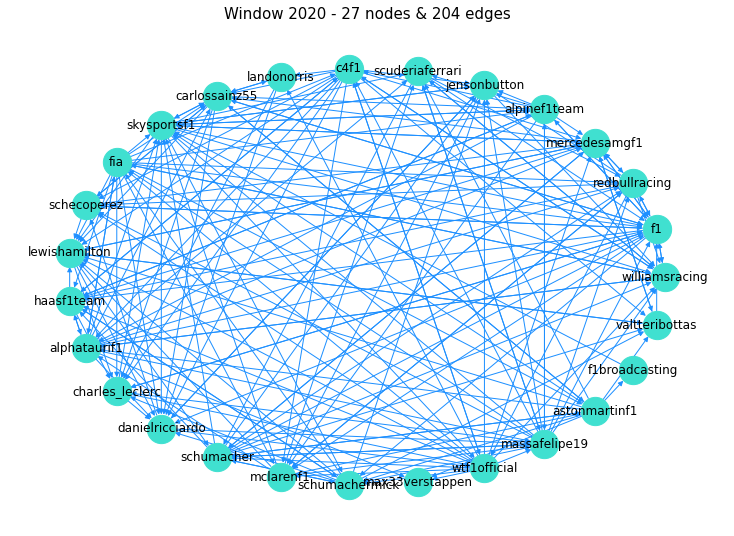

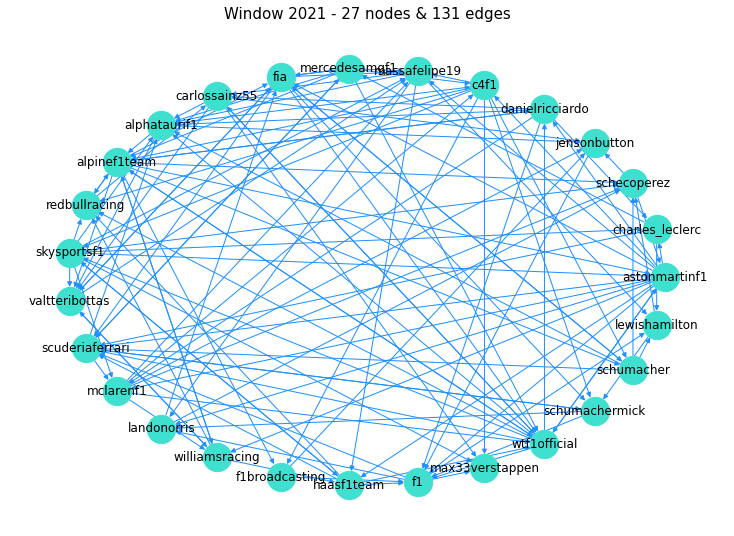

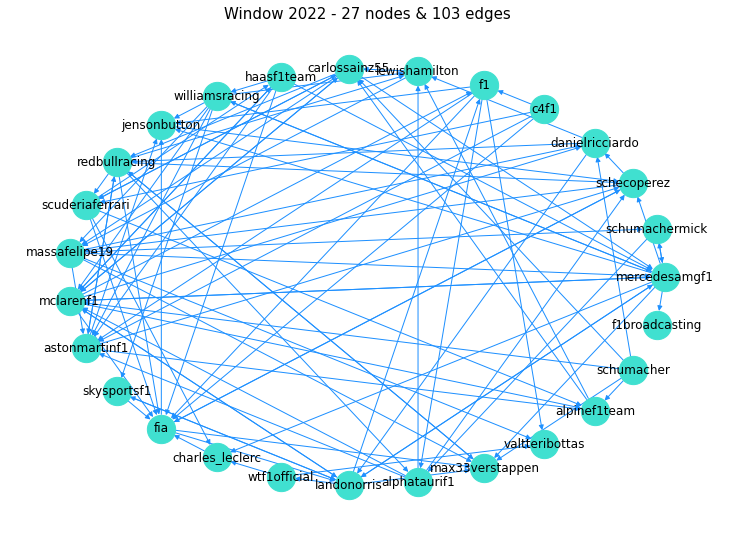

In [90]:
window_networks = draw_window_networks(years)

**From the time window network graphs above, we can see that over the years, less and less followers had reciprocated relationships where both nodes (accounts) connected by an edge follow each other:**
- **2020 --> 207 edges**
- **2021 --> 131 edges**
- **2022 --> 103 edges**

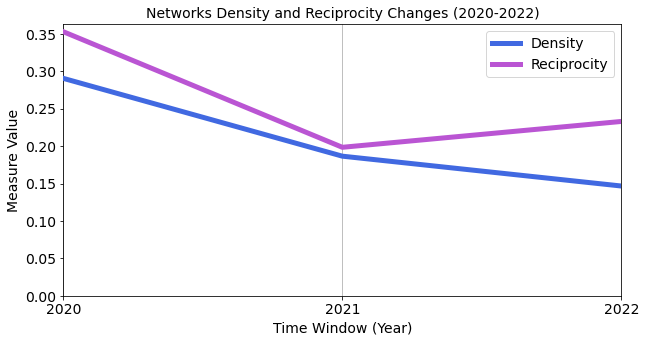

In [91]:
rows = []
for year in years:
    row = {"Year" : year, "Density" : nx.density(window_networks[year]), 
           "Reciprocity" : nx.reciprocity(window_networks[year])}
    rows.append(row)
data_stats = pd.DataFrame(rows).set_index("Year")

ax9 = data_stats.plot(figsize=(10,5), fontsize=14, zorder=3, color=["royalblue", "mediumorchid"], linewidth=5)
ax9.set_xlabel("Time Window (Year)", fontsize=14)
ax9.set_ylabel("Measure Value", fontsize=14)
ax9.legend(fontsize=14)
ax9.set_title("Networks Density and Reciprocity Changes (2020-2022)", fontsize=14)
ax9.set_xticks(years)
ax9.set_ylim(0)
ax9.set_xlim(years[0], years[-1])
ax9.xaxis.grid();

**Network Density --> refers to the portion of potential edges between nodes in a network that exist as actual edges.**

**Reciprocity --> a measure of the fraction of reciprocated edges in a directed network, i.e., the ratio of the number of edges pointing in both directions to the total number of edges in the network.**

**From this graph, we can observe that the density values have been consistently declining over the 3 years and the reciprocity (directed followers i.e."Twitter mutuals") values have decreased between the years 2020-2021 and increased between 2021-2022.**